In [5]:
import pandas as pd
from os import path, scandir

In [ ]:
diff_results_df.head()
out_fname=path.join(expt_dir,'results','Figure_3d_diff_expression_table.tab')
diff_results_d

In [4]:
data_dir='../datasets'
ADE_GENES=['ACE2','CD300LF', 'ERVW-1','FCGR2A','FCGR2B','FUT8','IFNB1', 'IFNG','KLRC1','KLRD1','LIF',
 'LIFR','LILRB1','MYD88','NRP1','NRP2','TMPRSS2']

In [29]:
out_path_dir=path.join(data_dir,'results','differential_expression')
for fn in scandir(path.join(data_dir,'results','differential_expression','all_genes')):
    tmp_path=path.abspath(fn.path)
    if not path.basename(tmp_path).startswith('Figure_'):continue
    print(path.basename(tmp_path))
    tmp_df=pd.read_csv(fn.path,sep='\t')
    tmp_df=tmp_df[tmp_df.gene_name.isin(ADE_GENES)]
    tmp_outfname=path.join(out_path_dir,'target_genes_'+path.basename(tmp_path).rstrip('.zip'))
    print(tmp_outfname)
    tmp_df.to_csv(tmp_outfname,sep='\t',index=None)
    print()

Figure_1d_diff_expression_table1.tab.zip
../datasets/results/differential_expression/target_genes_Figure_1d_diff_expression_table1.tab

Figure_3d_diff_expression_table2.tab.zip
../datasets/results/differential_expression/target_genes_Figure_3d_diff_expression_table2.tab



In [23]:
help(tmp_df.to_csv)

Help on method to_csv in module pandas.core.generic:

to_csv(path_or_buf:Union[str, pathlib.Path, IO[~AnyStr], NoneType]=None, sep:str=',', na_rep:str='', float_format:Union[str, NoneType]=None, columns:Union[Sequence[collections.abc.Hashable], NoneType]=None, header:Union[bool, List[str]]=True, index:bool=True, index_label:Union[bool, str, Sequence[collections.abc.Hashable], NoneType]=None, mode:str='w', encoding:Union[str, NoneType]=None, compression:Union[str, Mapping[str, str], NoneType]='infer', quoting:Union[int, NoneType]=None, quotechar:str='"', line_terminator:Union[str, NoneType]=None, chunksize:Union[int, NoneType]=None, date_format:Union[str, NoneType]=None, doublequote:bool=True, escapechar:Union[str, NoneType]=None, decimal:Union[str, NoneType]='.', errors:str='strict') -> Union[str, NoneType] method of pandas.core.frame.DataFrame instance
    Write object to a comma-separated values (csv) file.
    
    .. versionchanged:: 0.24.0
        The order of arguments for Series

In [1]:
import re
import scanpy as sc
import diffxpy.api as de
import utility_functions as utils
import seaborn as sns, pandas as pd, numpy as np
from os import path, scandir
from matplotlib import pyplot as plt

%matplotlib inline

/anaconda/lib/python3.6/site-packages/numba/core/errors.py:149: UserWarning: Insufficiently recent colorama version found. Numba requires colorama >= 0.3.9
  warnings.warn(msg)

Bad key "text.kerning_factor" on line 4 in
/anaconda/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
http://github.com/matplotlib/matplotlib/blob/master/matplotlibrc.template
or from the matplotlib source distribution


In [2]:
#expt_figdir='../figure'
expt_figdir='../figures'
expt_dir='../datasets'
utils.safe_mkdir(expt_figdir)
utils.safe_mkdir(expt_dir)

#scanpy settings
sc.settings.figdir=expt_figdir
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80)
sc.settings.writedir=expt_dir

Directory already exists
Directory already exists


In [3]:
#Global variables and parameters
ADE_GENES=['ACE2','CD300LF', 'ERVW-1','FCGR2A','FCGR2B','FUT8','IFNB1', 'IFNG','KLRC1','KLRD1','LIF',
 'LIFR','LILRB1','MYD88','NRP1','NRP2','TMPRSS2']
immunoregulatory_profibrotic_macrophages=['A2M','GPR183','CCL13','TREM2','TGFB1','SPP1']
chemokine_like_macrophages=['CCL2', 'CCL3', 'CXCL10']
peripheral_monocyte_like_macrophages=['S100A8','FCN1','CD14']
macrophages_subtypes_markers=['FCN1', 'SPP1', 'FABP4']
markers=['CD68', 'FCGR3B', 'CD1C', 'CLEC9A', 'LILRA4', 'KLRD1','CD3D', 'MS4A1', 'IGHG4', 'TPPP3', 'KRT18']
markers_dict={'CD68':'Macrophages', 'FCGR3B':'Neutrophils', 'CD1C':'mDCs', 'CLEC9A':'mDCs', 'LILRA4':'pDCs', 
              'KLRD1':'NK cells','CD3D':'T cells', 'MS4A1':'B cells', 'IGHG4':'Plasma cells', 
              'TPPP3':'Epithelial cells', 'KRT18':'Epithelial cells'}
#Palettes
LOUVAIN_SP_COLORS_DICT={0: '#0173b2', 1: '#de8f05', 2: '#029e73',3: '#d55e00', 4: '#cc78bc',
 5: '#ca9161',6: '#fbafe4', 7: '#949494', 8: '#ece133', 9: '#56b4e9', 10: '#0173b2', 11: '#de8f05',
 12: '#029e73', 13: '#d55e00', 14: '#cc78bc', 15: '#ca9161', 16: '#fbafe4', 17: '#949494', 18: '#ece133',
 19: '#56b4e9'}
DERIVED_ORGANS_PALETTE=sns.color_palette(palette='Set1',n_colors=18).as_hex()
DERIVED_ORGANS_PALETTE_DICT=dict(zip(['blood', 'brain (organoid)', 'colon', 'decidua', 'embryo', 'esophagus', 'eye', 'hematopoietic system', 'hematopoietic system (cell line)', 'immune system', 'immune system (cell line)', 'kidney', 'liver', 'lung', 'mediastinal lymph node',
          'pancreas', 'placenta', 'spleen'],DERIVED_ORGANS_PALETTE))

DERIVED_ORGANS_PALETTE_DICT={'blood': '#e41a1c',
 'brain (organoid)': '#377eb8',
 'colon': '#4daf4a',
 'decidua': '#984ea3',
 'embryo': '#ff7f00',
 'esophagus': '#ffff33',
 'eye': '#a65628',
 'hematopoietic system': '#f781bf',
 'hematopoietic system (cell line)': '#999999',
 'immune system': '#e41a1c',
 'immune system (cell line)': '#377eb8',
 'kidney': '#4daf4a',
 'liver': '#984ea3',
 'lung': '#ff7f00',
 'mediastinal lymph node': '#ffff33',
 'pancreas': '#a65628',
 'placenta': '#f781bf',
 'spleen': '#999999'}

SPs_COLORS_DICT={'AdventitialFibroblast_P1': '#e41a1c','AlveolarEpithelialType1_P1': '#377eb8','Artery_P1': '#999999',
 'Bcells': '#f781bf','Ciliated': '#f781bf','Ciliated1': '#377eb8','Ciliated_P1': '#ff7f00','Dendriticcells': '#ffff33',
 'DifferentiatingBasal_P1': '#4daf4a','Fibroblast': '#4daf4a','Goblet2': '#4daf4a','Goblet_1': '#a65628',
 'Immuno_Monocytes': '#ff7f00','Immuno_TCells': '#e41a1c','Luminal_Macrophages': '#377eb8','Mesothelial_P1': '#ffff33',
 'Neutrophils': '#a65628','ProliferatingBasal_P1': '#999999','TandNK': '#984ea3','Type2alveolar': '#984ea3',
 'Type_1_alveolar': '#e41a1c'}

TOP_CELL_TYPE_COLORS_DICT={'AdventitialFibroblast_P1': '#8dd3c7',
 'AirwaySmoothMuscle_P1': '#ffffb3',
 'AirwaySmoothMuscle_P2': '#ffffb3',
 'AlveolarEpithelialType1_P1': '#bebada',
 'AlveolarEpithelialType1_P2': '#bebada',
 'AlveolarEpithelialType2_P1': '#bebada',
 'AlveolarFibroblast_P1': '#bebada',
 'Artery_P1': '#fb8072',
 'Artery_P2': '#fb8072',
 'Basal2': '#80b1d3',
 'Bcells': '#fdb462',
 'BronchialVessel1_P1': '#b3de69',
 'BronchialVessel2_P1': '#b3de69',
 'Capillary_P1': '#fccde5',
 'Ciliated1': '#d9d9d9',
 'Ciliated2': '#d9d9d9',
 'Ciliated_P1': '#d9d9d9',
 'Club_P1': '#bc80bd',
 'Dendriticcells': '#ccebc5',
 'DifferentiatingBasal_P1': '#ffed6f',
 'Endothelial': '#8dd3c7',
 'Fibroblast': '#ffffb3',
 'Fibroblasts': '#ffffb3',
 'Goblet2': '#bebada',
 'Immuno_Monocytes': '#fb8072',
 'Immuno_TCells': '#fb8072',
 'Lipofibroblast_P1': '#80b1d3',
 'Luminal_Macrophages': '#fdb462',
 'Lymphatic': '#b3de69',
 'LymphaticEndothelium': '#b3de69',
 'Lymphatic_P1': '#b3de69',
 'Lymphatic_P2': '#b3de69',
 'Mastcells': '#fccde5',
 'Mesothelial_P1': '#d9d9d9',
 'Mesothelium': '#d9d9d9',
 'Myofibroblast_P1': '#bc80bd',
 'Myofibroblast_P2': '#bc80bd',
 'Neutrophils': '#ccebc5',
 'Pericyte_P1': '#ffed6f',
 'ProliferatingBasal_P1': '#8dd3c7',
 'Secretory1': '#ffffb3',
 'Secretory2': '#ffffb3',
 'Secretory3': '#ffffb3',
 'Smoothmuscle': '#bebada',
 'TandNK': '#fb8072',
 'Type2alveolar': '#80b1d3',
 'Type_1_alveolar': '#80b1d3',
 'VascularSmoothMuscle_P2': '#fdb462',
 'Vein_P1': '#b3de69'}

Y_CHROM_GENES=['DBY', 'SMCY', 'UTY', 'RPS4Y','USP9Y']
X_CHROM_GENES=['XIST']

HEATPLOT_PALETTE_CMAP="vlag"

PATIENT_GROUP_COL_DICT={'severe':'#ff7f0e', 'healthy control':'#279e68','mild':'#1f77b4'}

In [4]:
biomart_gene_names = sc.queries.biomart_annotations(org="hsapiens",attrs=["ensembl_gene_id","hgnc_symbol","chromosome_name"])

In [5]:
ade_ensembl_df=biomart_gene_names[biomart_gene_names.hgnc_symbol.isin(ADE_GENES)]
ade_ensembl_id_dict=dict(zip(ade_ensembl_df['ensembl_gene_id'],ade_ensembl_df['hgnc_symbol']))
del ade_ensembl_df

In [29]:
cell_type_markers_lst=[]
for tmp_fname in utils.get_list_of_specific_file_type(directory=path.join(expt_dir,'markers/ucsc_single_cell/'),
                                                      file_pattern='.tsv'):
    tmp_fname_parts=tmp_fname.split('/')
    if tmp_fname_parts[-1].endswith('_exprMatrix.tsv') or tmp_fname_parts[-1].endswith('meta.tsv'):continue
    tmp_df=pd.read_table(tmp_fname,header=0)[['id' , 'symbol']]
    tmp_df['type']=re.sub(string=tmp_fname_parts[-1],pattern='.tsv',repl='')
    tmp_df['dataset']=tmp_fname_parts[-2]
    cell_type_markers_lst.append(tmp_df)
cell_type_markers_df=pd.concat(cell_type_markers_lst).reset_index(drop=True)
print(cell_type_markers_df.head())
cell_type_markers_dict={}
for c in cell_type_markers_df.groupby('type'):
    cell_type_markers_dict[c[0]]=c[1]['id'].to_list()

       id  symbol    type                      dataset
0   MMP10   MMP10  Basal1  Eils_Lung_and_HBECs_Airways
1  CXCL14  CXCL14  Basal1  Eils_Lung_and_HBECs_Airways
2    BCAM    BCAM  Basal1  Eils_Lung_and_HBECs_Airways
3    KRT5    KRT5  Basal1  Eils_Lung_and_HBECs_Airways
4  EFEMP1  EFEMP1  Basal1  Eils_Lung_and_HBECs_Airways


In [30]:
cell_type_markers_ensemble_id_dict={}
for k,v in cell_type_markers_dict.items():
    tmp_gene_set=set()
    for g in v:
        tmp_ensembl_id=biomart_gene_names[biomart_gene_names.hgnc_symbol==g]['ensembl_gene_id'].values
        if len(tmp_ensembl_id)<1:continue
        tmp_gene_set.update(tmp_ensembl_id)
    cell_type_markers_ensemble_id_dict[k]=list(tmp_gene_set)

In [6]:
# Covid19 patients data

In [7]:
qc_filtered_adata=sc.read_loom(filename=path.join(expt_dir,'qc_filt_zhang_dataset.loom'))
tmp_cols=[]
for c in qc_filtered_adata.var.columns:
    if not c.startswith('Gene'):continue
    tmp_cols.append(c)
tmp_gene_names_df=qc_filtered_adata.var.loc[:,tmp_cols]
tmp_gene_names=[]
for k,v in tmp_gene_names_df.apply(axis=1,func=pd.unique).items():
    v=v.tolist()
    if len(v)>1:
        v.remove('nan')
    tmp_gene_names.append(v[0])
qc_filtered_adata.var['all_genes_hgnc_symbol']=tmp_gene_names
qc_filtered_adata.var_names=tmp_gene_names
ncov_val=qc_filtered_adata[:,'nCoV'].X.todense()
qc_filtered_adata.obs['nCoV_expression']=[m[0] for m in ncov_val.tolist()]
del tmp_gene_names,k,v,tmp_gene_names_df,tmp_cols,ncov_val

In [8]:
qc_filtered_adata.uns['patient_group_colors']=['#1f77b4','#279e68','#ff7f0e']

... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'batch' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'Gene-0' as categorical
... storing 'Gene-1' as categorical
... storing 'Gene-10' as categorical
... storing 'Gene-11' as 

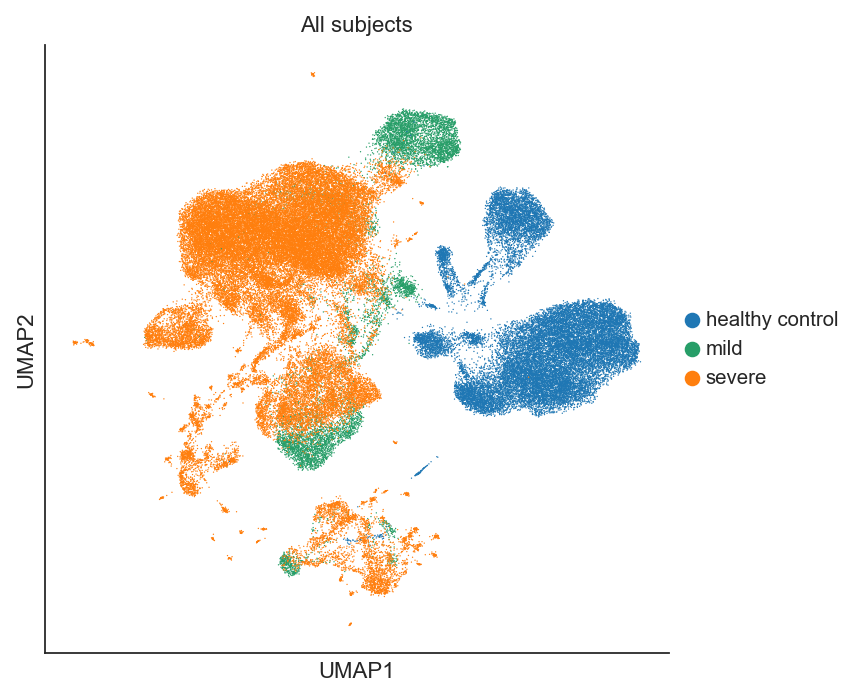

In [9]:
sc.set_figure_params(figsize=(5,5),frameon=True,fontsize=10.0)
with sns.axes_style('ticks'):
    tmp_umap_fig=sc.pl.umap(adata=qc_filtered_adata,frameon=True,return_fig=True,use_raw=False,
                            title='All subjects',color='patient_group',add_outline=False)
    sns.despine()
    tmp_umap_fig.savefig(path.join(expt_figdir,'umap_fig2a.pdf'))

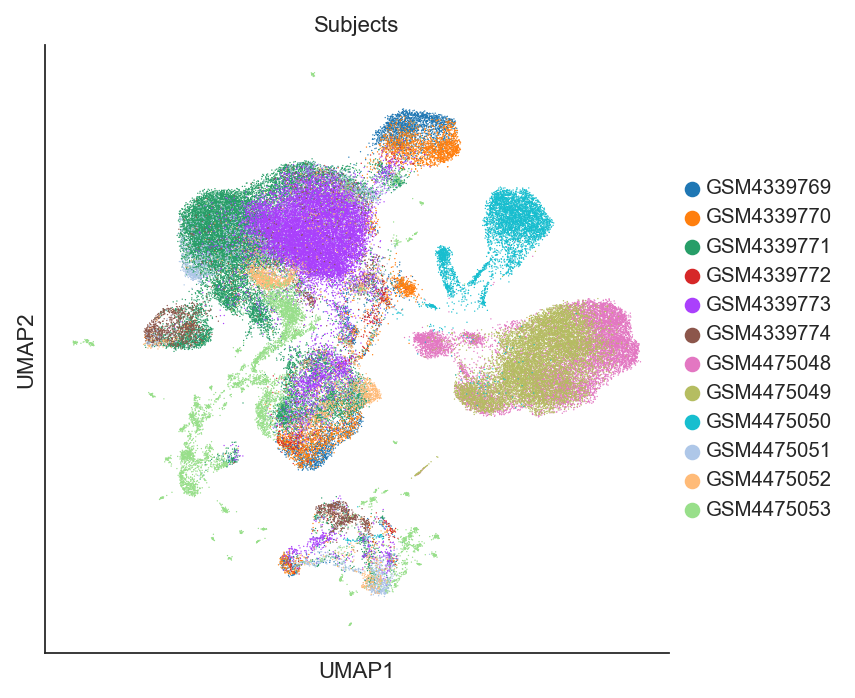

In [10]:
sc.set_figure_params(figsize=(5,5),frameon=True,fontsize=10.0)
with sns.axes_style('ticks'):
    tmp_umap_fig=sc.pl.umap(adata=qc_filtered_adata,frameon=True,return_fig=True,use_raw=False,
                            title='Subjects',color='sample_accesssion',add_outline=False)
    sns.despine()

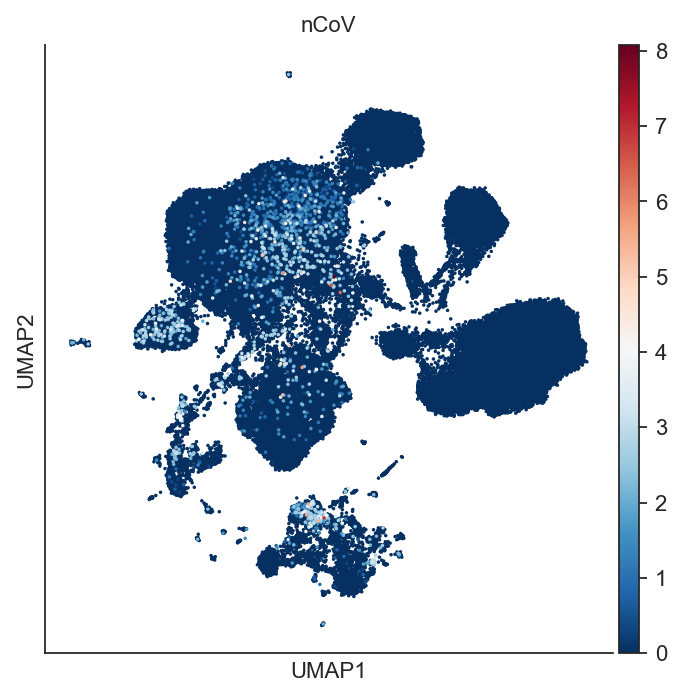

In [11]:
#sc.set_figure_params(figsize=(5,5),frameon=True,fontsize=10.0)
sns.set_style(style='ticks')
tmp_umap_fig=sc.pl.umap(adata=qc_filtered_adata,frameon=True,return_fig=True,use_raw=False,size=10,
                        color_map='RdBu_r',gene_symbols='all_genes_hgnc_symbol',
                        title='nCoV',color=['nCoV'],add_outline=False)
sns.despine()
tmp_umap_fig.savefig(path.join(expt_figdir,'_ncovid_transcripts_fig2a.pdf'))

['ACE2', 'CD300LF', 'ERVW-1', 'FCGR2A', 'FCGR2B', 'FUT8', 'IFNB1', 'IFNG', 'KLRC1', 'KLRD1', 'LIF', 'LIFR', 'LILRB1', 'MYD88', 'NRP1', 'NRP2', 'TMPRSS2']


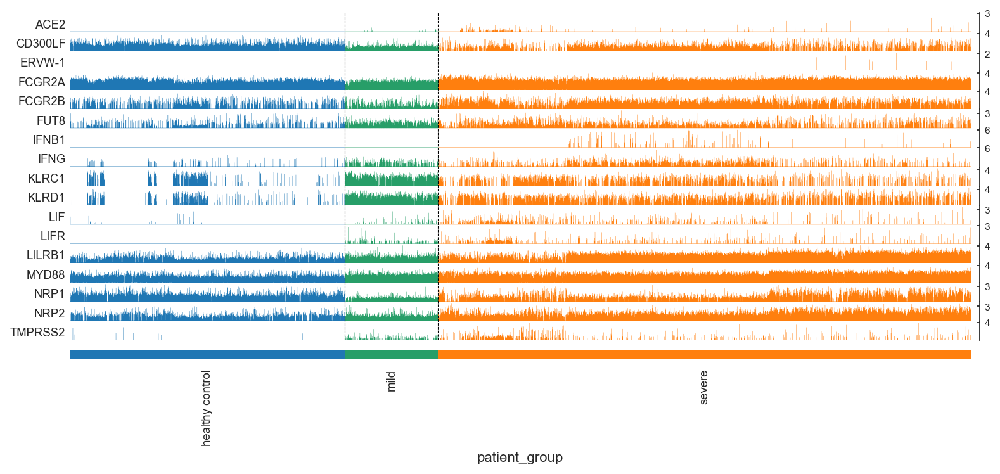

In [12]:
tmp_genes_list=sorted(qc_filtered_adata.var[qc_filtered_adata.var['all_genes_hgnc_symbol'].isin(ADE_GENES)]['all_genes_hgnc_symbol'].tolist())
if len(tmp_genes_list)>0:
    print(tmp_genes_list)
    qc_filtered_adata.var_names_make_unique()
    tmp_trackplot_fig=sc.pl.tracksplot(adata=qc_filtered_adata,var_names=tmp_genes_list,
                                       gene_symbols='all_genes_hgnc_symbol',
                                       use_raw=False,rotation=90,groupby='patient_group',
                                       save='_target_genes_fig2b.pdf')
    print()  

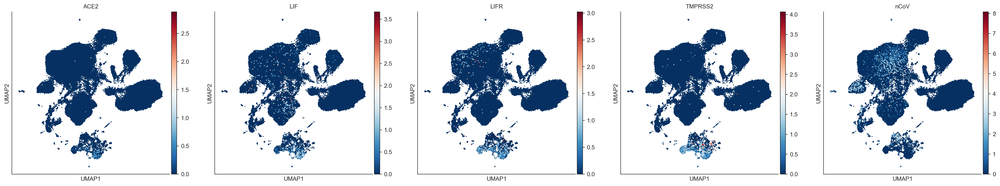

In [13]:
tmp_markers_genes_list=sorted(['ACE2','TMPRSS2','LIFR','LIF','nCoV'])
tmp_umap_fig=sc.pl.umap(adata=qc_filtered_adata,frameon=True,size=10.0,color=tmp_markers_genes_list,ncols=5,
                        color_map='RdBu_r',gene_symbols='all_genes_hgnc_symbol',return_fig=True,use_raw=False,
                        add_outline=False,**{'norm':None})
sns.despine()
tmp_umap_fig.savefig(path.join(expt_figdir,'umap_target_genes_fig2b.pdf'))

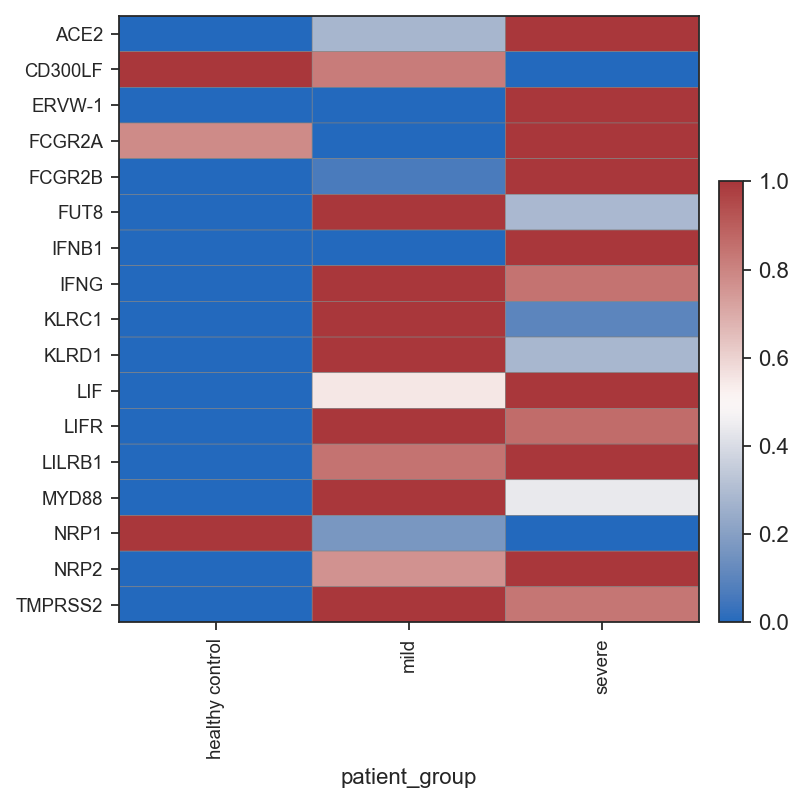

In [14]:
tmp_markers_genes_list=[g for g in sorted(set(ADE_GENES).intersection(qc_filtered_adata.var['all_genes_hgnc_symbol']))]
#sc.pl.tracksplot(adata=tmp_adata, var_names=tmp_ade_genes_list,groupby='louvain',dendrogram=True,figsize=tmp_fig_size)
if len(tmp_markers_genes_list)>=1:
    tmp_fig=sc.pl.matrixplot(adata=qc_filtered_adata,groupby='patient_group',
                             gene_symbols='all_genes_hgnc_symbol',
                             save='heatplot_fig2c.pdf',
                             use_raw=False,
                             figsize=(5,5),var_names=tmp_markers_genes_list,standard_scale='var',
                             cmap=HEATPLOT_PALETTE_CMAP,swap_axes=True,dendrogram=False)

In [15]:
all_lns=[]
with open(path.join(expt_dir,'GSE145926_family.soft'),'r') as fh:
    all_lns.extend(fh.readlines())
all_samples_dict={}    
len_lns=len(all_lns)
indices = [i for i, x in enumerate(all_lns) if x[1:7]=='SAMPLE']

for i in range(len(indices)):
    tmp_sample=all_lns[indices[i]].split('=')[-1].lstrip().rstrip().strip()
    
    tmp_annotation_dict={}
    tmp_lns=[]
    if indices[i]<indices[-1]:
        tmp_lns.extend(all_lns[indices[i]+1:indices[i+1]])
    else:
        tmp_lns.extend(all_lns[indices[i]+1::])
        
    for tmp_ln in tmp_lns:
        tmp_ln_prts=tmp_ln.split('=')
        tmp_key=tmp_ln_prts[0].strip().lstrip().rstrip()[1::]
        if re.match(pattern="^\s.+:\s.+",string=tmp_ln_prts[1]):
            tmp_value=tmp_ln_prts[1].strip().lstrip().rstrip()
            tmp_key='_'.join([tmp_key,tmp_value[0:tmp_value.index(':')].lstrip().rstrip().strip()]).replace(' ','_')
            tmp_annotation_dict[tmp_key]=tmp_value[tmp_value.index(':')+1::].lstrip().rstrip().strip() 
        else:
            tmp_annotation_dict[tmp_key]=tmp_ln_prts[1].strip('\n\r').lstrip().rstrip() 
    all_samples_dict[tmp_sample]=tmp_annotation_dict
    
all_keys=set()
for k,v in all_samples_dict.items():
    all_keys.update([tmp_k for tmp_k in v.keys()])    
for k,v in all_samples_dict.items():
    all_keys.intersection_update([tmp_k for tmp_k in v.keys()])
all_keys_lst=list(all_keys)

out_lst=[]
for s,a in all_samples_dict.items():
    tmp_lst=[s]
    for c in all_keys_lst:
        tmp_lst.append(a[c])
    out_lst.append(tmp_lst)
all_keys_lst.insert(0,'Sample_name')
sample_meta_df=pd.DataFrame(out_lst,columns=all_keys_lst)
sample_names=[]
for s in sample_meta_df.Sample_title:
    tmp_s=s.split('(')[0].split(',')[-1].lstrip().rstrip().strip()
    sample_names.append(tmp_s)
sample_meta_df['Sample_title_edit']=sample_names
sample_meta_df.head()

,Sample_name,Sample_taxid_ch1,Sample_characteristics_ch1_patient_group,Sample_extract_protocol_ch1,Sample_contact_state,Sample_molecule_ch1,Sample_library_source,Sample_type,Sample_submission_date,Sample_relation_BioSample,...,Sample_contact_country,Sample_contact_institute,Sample_contact_city,Sample_data_processing_Supplementary_files_format_and_content,Sample_contact_name,Sample_title,Sample_instrument_model,Sample_description,Sample_characteristics_ch1_cell_subsets,Sample_title_edit
0,GSM4339769,9606,mild,Total 11 µl of single cell suspension and 40 µ...,Guangdong,polyA RNA,transcriptomic,SRA,Feb 25 2020,https://www.ncbi.nlm.nih.gov/biosample/SAMN142...,...,China,Shenzhen 3rd People's Hospital,Shenzhen,"h5, raw count matrix generated by Cell Ranger ...","Zheng,,Zhang","BALF, C141 (scRNA-seq)",BGISEQ-500,Single-cell RNAseq data,Total cell,C141
1,GSM4339770,9606,mild,Total 11 µl of single cell suspension and 40 µ...,Guangdong,polyA RNA,transcriptomic,SRA,Feb 25 2020,https://www.ncbi.nlm.nih.gov/biosample/SAMN142...,...,China,Shenzhen 3rd People's Hospital,Shenzhen,"h5, raw count matrix generated by Cell Ranger ...","Zheng,,Zhang","BALF, C142 (scRNA-seq)",BGISEQ-500,Single-cell RNAseq data,Total cell,C142
2,GSM4339771,9606,severe,Total 11 µl of single cell suspension and 40 µ...,Guangdong,polyA RNA,transcriptomic,SRA,Feb 25 2020,https://www.ncbi.nlm.nih.gov/biosample/SAMN142...,...,China,Shenzhen 3rd People's Hospital,Shenzhen,"h5, raw count matrix generated by Cell Ranger ...","Zheng,,Zhang","BALF, C143 (scRNA-seq)",BGISEQ-500,Single-cell RNAseq data,Total cell,C143
3,GSM4339772,9606,mild,Total 11 µl of single cell suspension and 40 µ...,Guangdong,polyA RNA,transcriptomic,SRA,Feb 25 2020,https://www.ncbi.nlm.nih.gov/biosample/SAMN142...,...,China,Shenzhen 3rd People's Hospital,Shenzhen,"h5, raw count matrix generated by Cell Ranger ...","Zheng,,Zhang","BALF, C144 (scRNA-seq)",BGISEQ-500,Single-cell RNAseq data,Total cell,C144
4,GSM4339773,9606,severe,Total 11 µl of single cell suspension and 40 µ...,Guangdong,polyA RNA,transcriptomic,SRA,Feb 25 2020,https://www.ncbi.nlm.nih.gov/biosample/SAMN142...,...,China,Shenzhen 3rd People's Hospital,Shenzhen,"h5, raw count matrix generated by Cell Ranger ...","Zheng,,Zhang","BALF, C145 (scRNA-seq)",BGISEQ-500,Single-cell RNAseq data,Total cell,C145


In [16]:
genes_min_cells=1
cells_min_genes=1000
hgv_genes_cnts=None
no_components=20
neighbours_metric='euclidean'
rank_no_genes_cut_off=500
tmp_adata_batch_corrected_dict={}
for tmp_patient in qc_filtered_adata.obs.patient_group.unique():
    tmp_adata=qc_filtered_adata[qc_filtered_adata.obs.index[qc_filtered_adata.obs.patient_group==tmp_patient],:]
    sc.pp.filter_genes(data=tmp_adata,inplace=True,min_cells=genes_min_cells)
    #sc.pp.filter_cells(data=tmp_adata,inplace=True,min_genes=cells_min_genes)
    sc.pp.highly_variable_genes(adata=tmp_adata,subset=False,inplace=True,n_top_genes=hgv_genes_cnts,
                                batch_key='sample_accesssion')
    sc.tl.pca(data=tmp_adata,use_highly_variable=True,n_comps=no_components)
    sc.pp.neighbors(adata=tmp_adata,metric=neighbours_metric)
    sc.tl.umap(adata=tmp_adata)
    sc.tl.louvain(adata=tmp_adata,flavor='vtraag')
    sc.tl.rank_genes_groups(adata=tmp_adata,groupby='louvain',method='logreg',rankby_abs=True,
                            n_genes=rank_no_genes_cut_off,use_raw=False)
    tmp_adata_batch_corrected_dict[tmp_patient]=tmp_adata
    del tmp_adata

filtered out 2282 genes that are detected in less than 1 cells


Trying to set attribute `.var` of view, copying.


extracting highly variable genes
    finished (0:00:13)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=20
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:27)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:33)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 18 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:05)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be in

Trying to set attribute `.var` of view, copying.


extracting highly variable genes
    finished (0:00:15)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=20
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:20)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:58)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 25 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:28)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be in

Trying to set attribute `.var` of view, copying.


extracting highly variable genes
    finished (0:00:07)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=20
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:11)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:23)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 14 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:07)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be in

In [17]:
for k, v in tmp_adata_batch_corrected_dict.items():
    print(k)

mild
severe
healthy control


In [18]:
for k, v in tmp_adata_batch_corrected_dict.items():
    print(k)
    for kl, l in v.obs.groupby('louvain'):
        print(kl,'(n=',l.shape[0],')')
    print()

mild
0 (n= 1038 )
1 (n= 917 )
2 (n= 859 )
3 (n= 803 )
4 (n= 798 )
5 (n= 690 )
6 (n= 587 )
7 (n= 543 )
8 (n= 402 )
9 (n= 379 )
10 (n= 349 )
11 (n= 296 )
12 (n= 240 )
13 (n= 213 )
14 (n= 167 )
15 (n= 127 )
16 (n= 65 )
17 (n= 42 )

severe
0 (n= 5821 )
1 (n= 4991 )
2 (n= 4866 )
3 (n= 4453 )
4 (n= 3845 )
5 (n= 3352 )
6 (n= 2749 )
7 (n= 2364 )
8 (n= 2308 )
9 (n= 2243 )
10 (n= 1771 )
11 (n= 1697 )
12 (n= 1489 )
13 (n= 1466 )
14 (n= 1350 )
15 (n= 1142 )
16 (n= 920 )
17 (n= 609 )
18 (n= 575 )
19 (n= 428 )
20 (n= 200 )
21 (n= 109 )
22 (n= 41 )
23 (n= 25 )
24 (n= 23 )

healthy control
0 (n= 3596 )
1 (n= 3584 )
2 (n= 3202 )
3 (n= 2772 )
4 (n= 2516 )
5 (n= 2496 )
6 (n= 1838 )
7 (n= 1377 )
8 (n= 1152 )
9 (n= 943 )
10 (n= 686 )
11 (n= 490 )
12 (n= 455 )
13 (n= 109 )



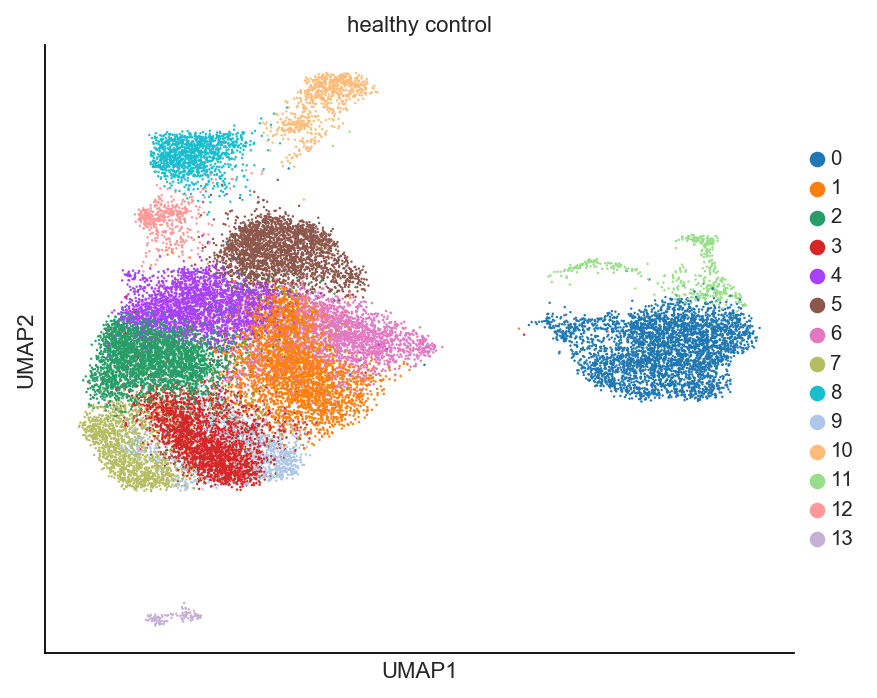

In [19]:
sc.set_figure_params(figsize=(6,5),frameon=True,fontsize=10.0)
category='healthy control'
tmp_adata=tmp_adata_batch_corrected_dict[category]
tmp_fig=sc.pl.umap(adata=tmp_adata,frameon=True,return_fig=True,use_raw=False,
                   title=category,show=True,
                   color='louvain',add_outline=False)
del tmp_adata
sns.despine()
tmp_fig.savefig(path.join(expt_figdir,'healthy_controls_subpopulation_umap_fig3a.pdf'))

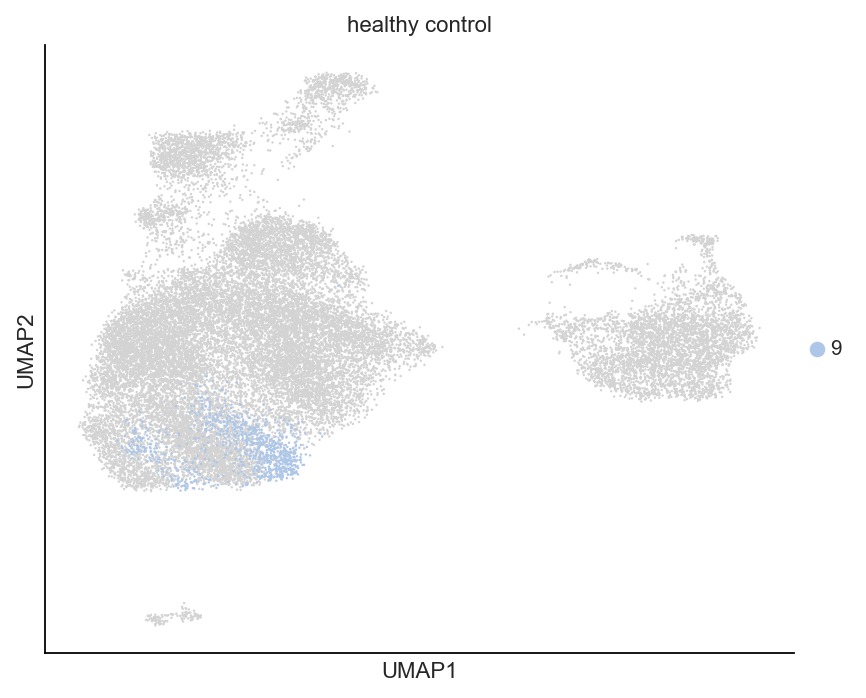

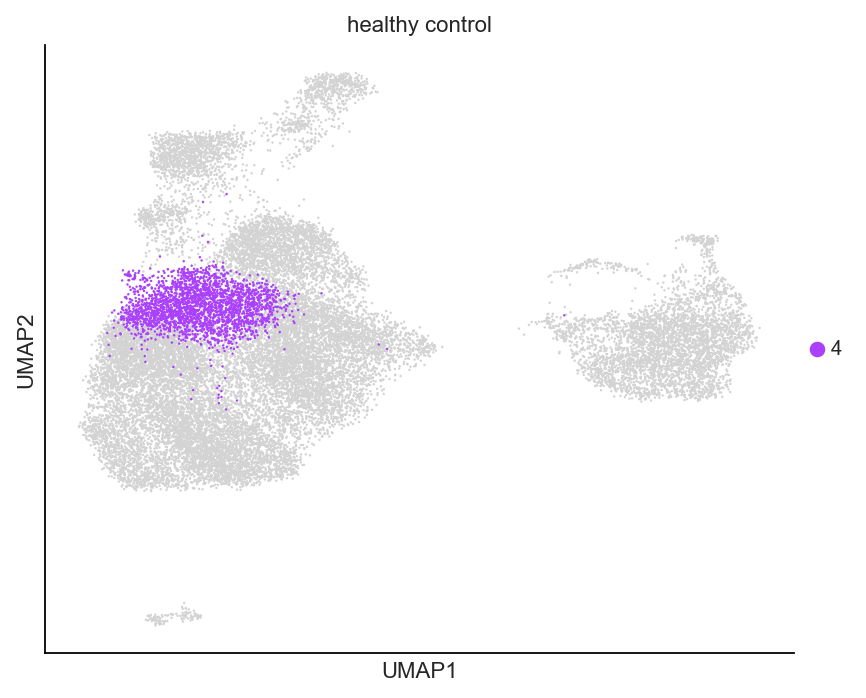

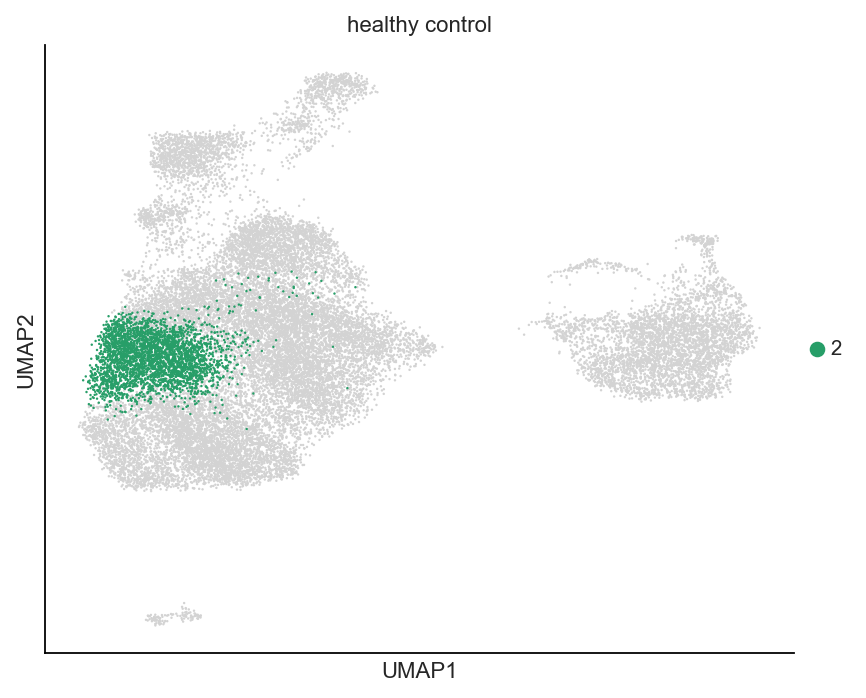

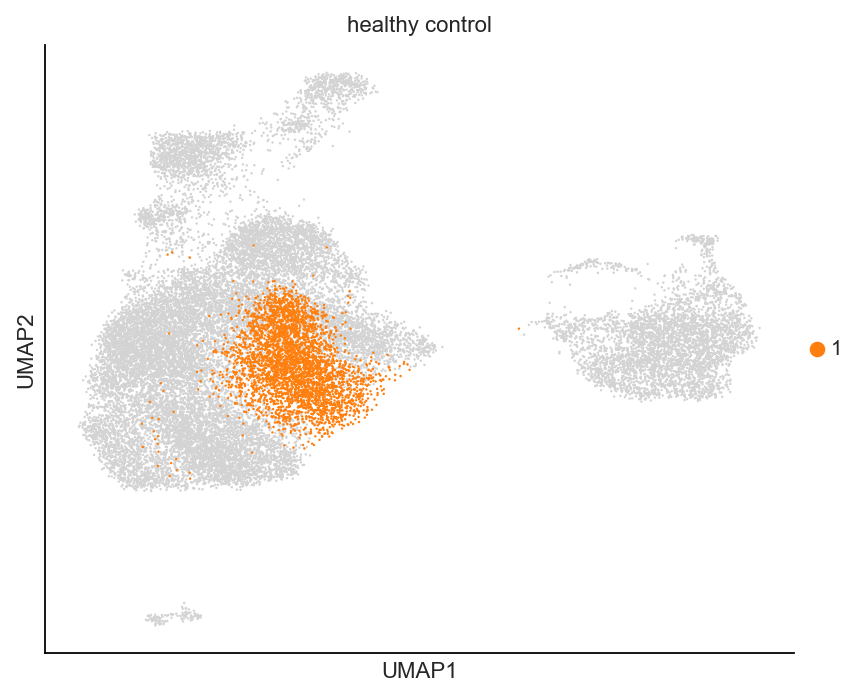

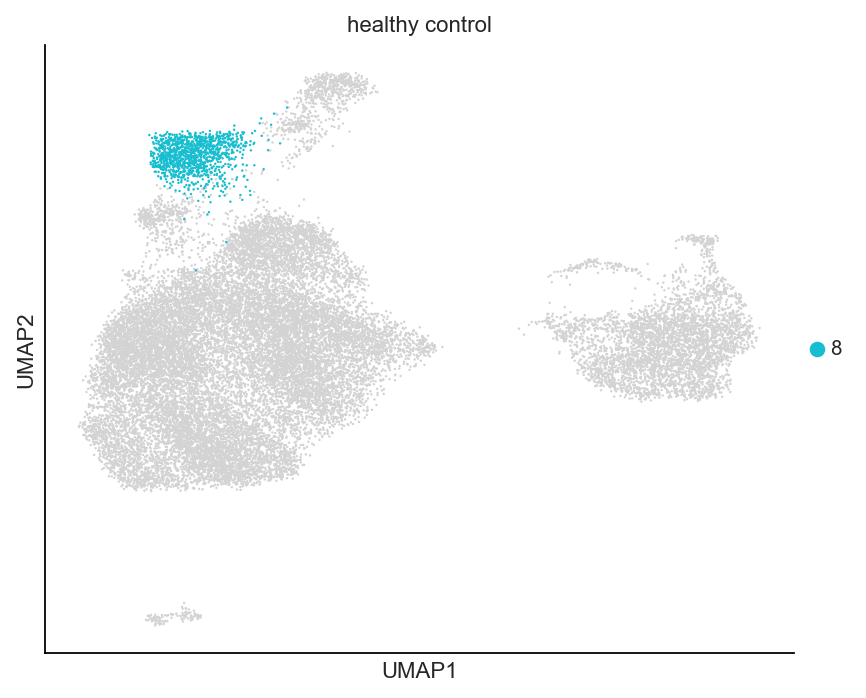

...

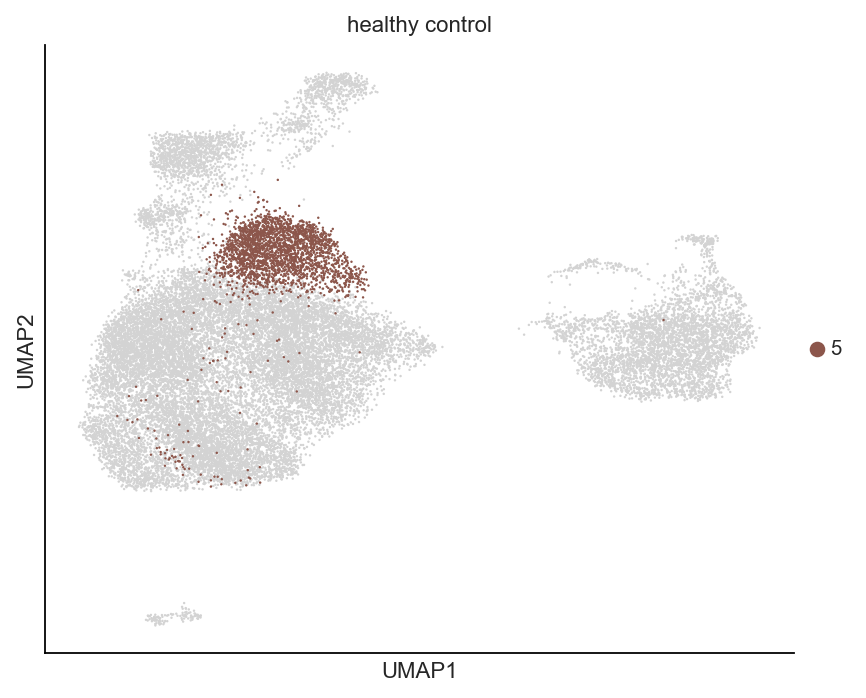

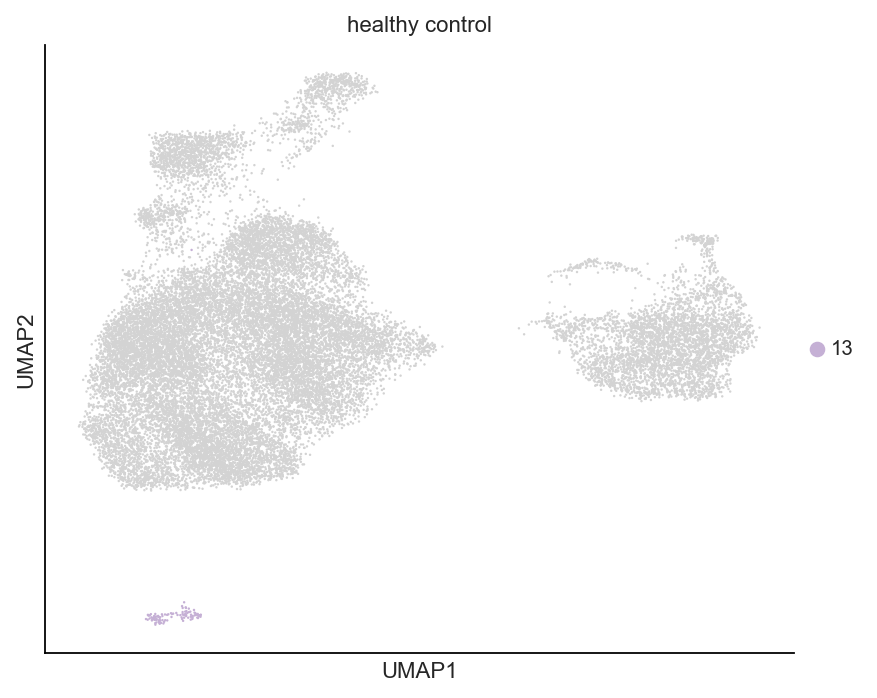

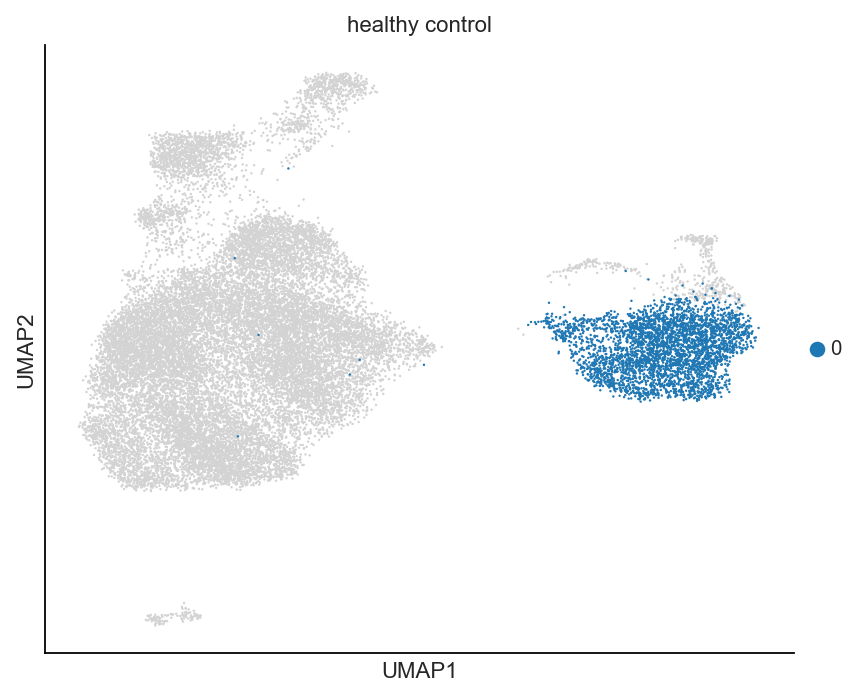

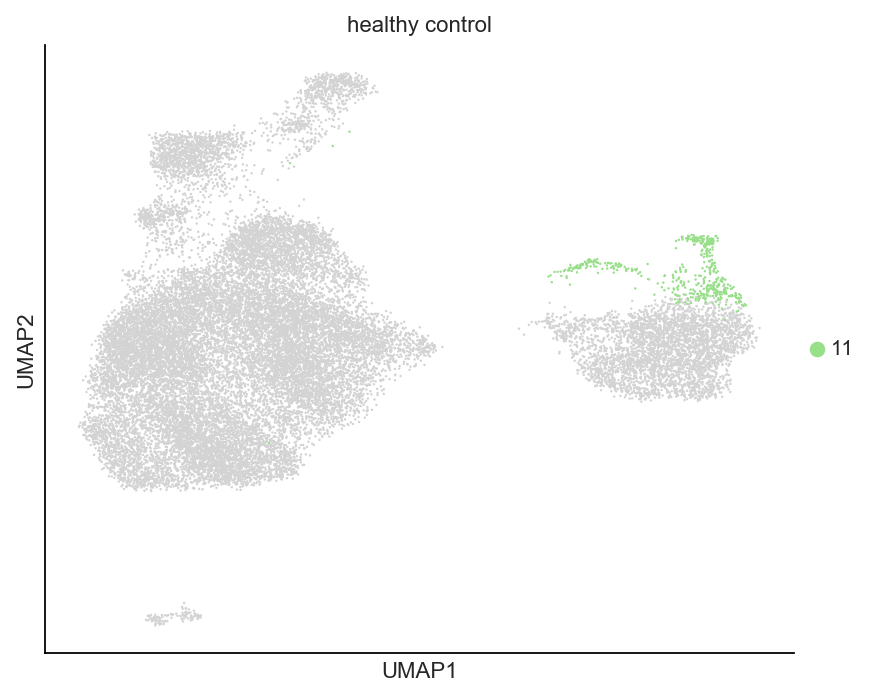

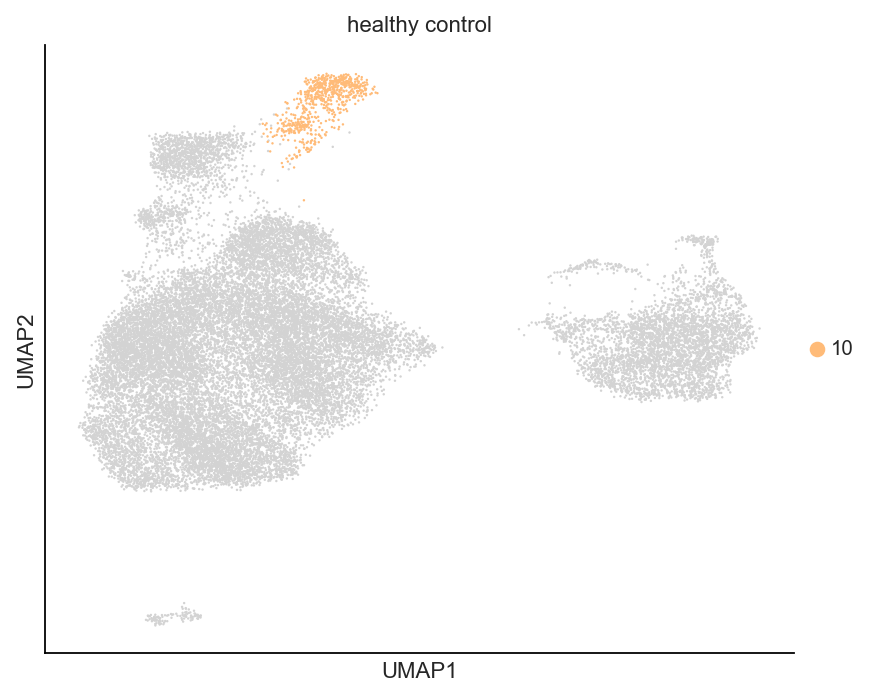

In [20]:
category='healthy control'
tmp_adata=tmp_adata_batch_corrected_dict[category]
for sp in tmp_adata.obs.louvain.unique():
    tmp_fig=sc.pl.umap(adata=tmp_adata,frameon=True,return_fig=True,use_raw=False,title=category,
                       show=True,groups=sp,
                   color='louvain',add_outline=False)
    sns.despine()
del tmp_adata

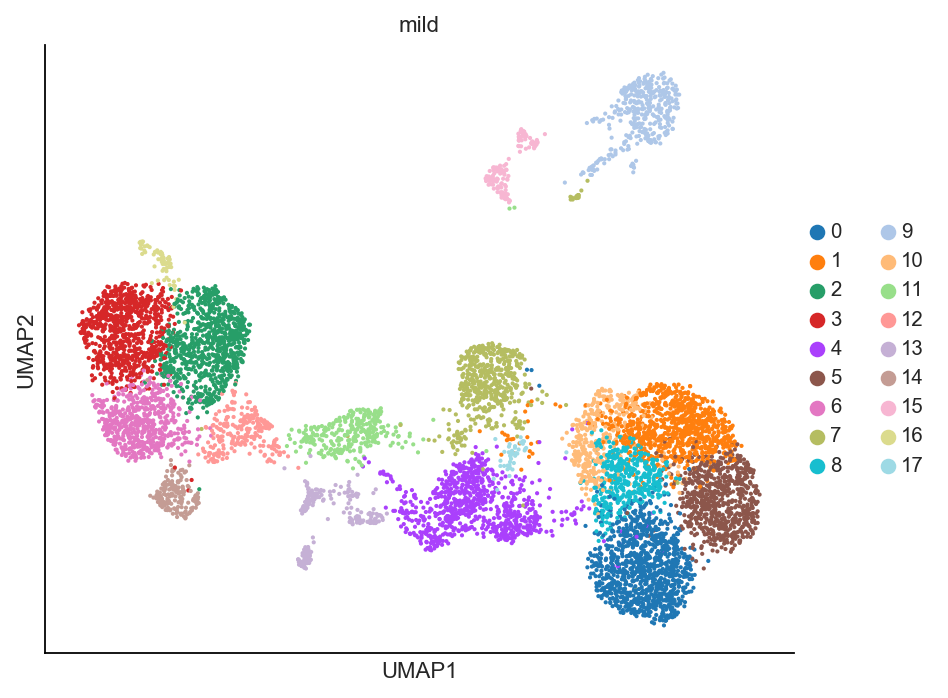

In [21]:
category='mild'
tmp_adata=tmp_adata_batch_corrected_dict[category]
tmp_fig=sc.pl.umap(adata=tmp_adata,frameon=True,return_fig=True,use_raw=False,title=category,show=True,
                   color='louvain',add_outline=False)
del tmp_adata
sns.despine()
tmp_fig.savefig(path.join(expt_figdir,'covid19_mild_subpopulation_umap_fig3b.pdf'))

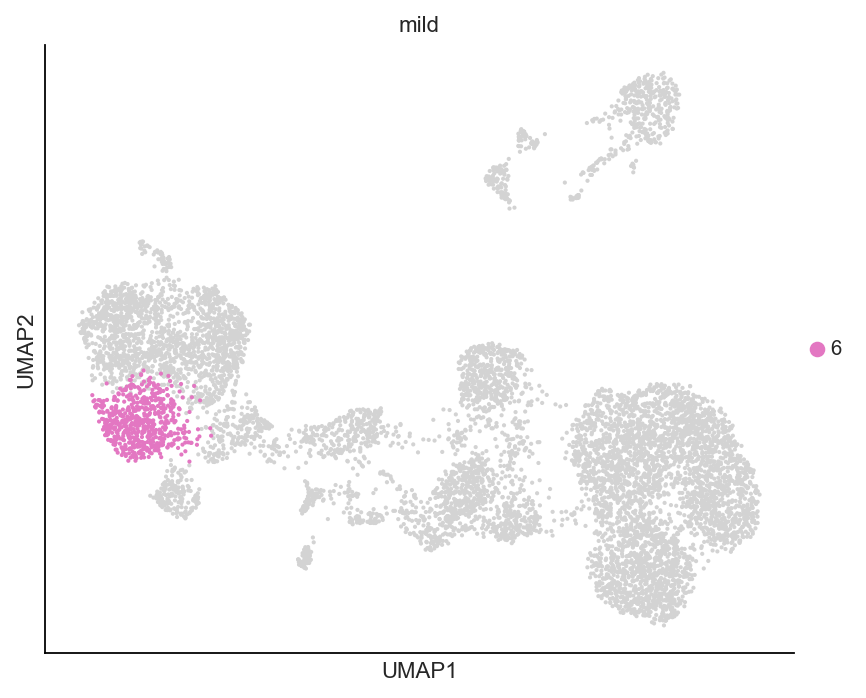

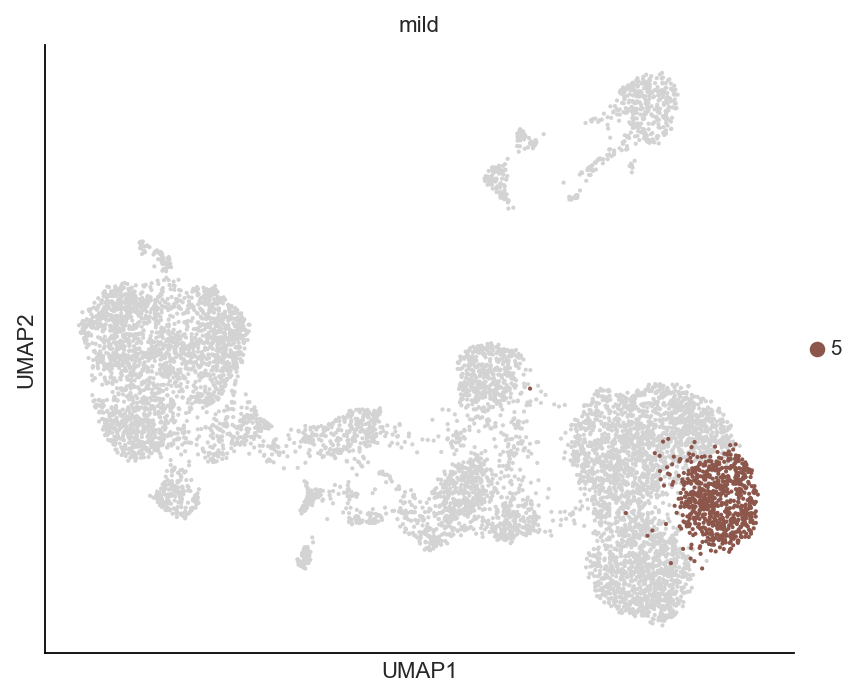

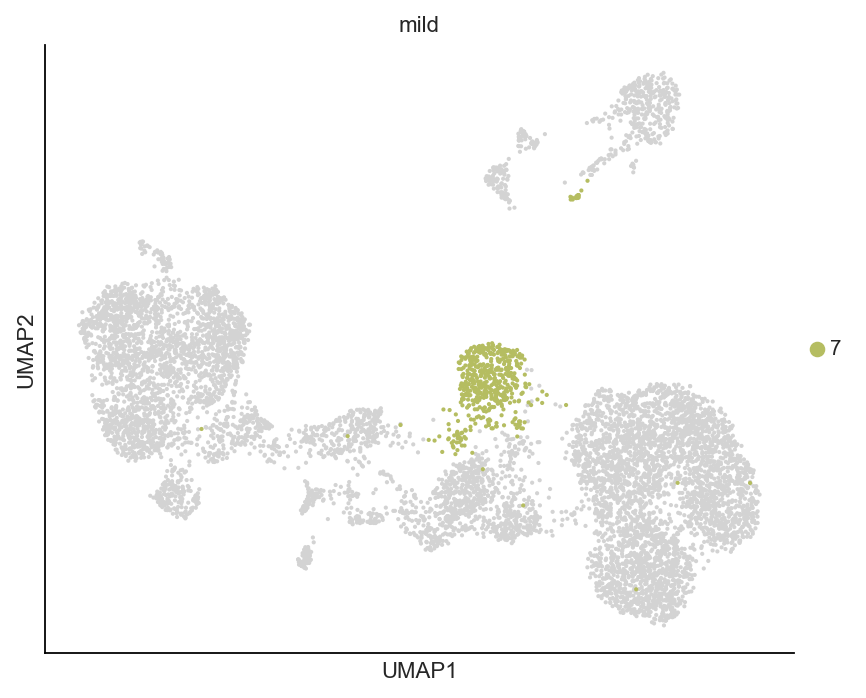

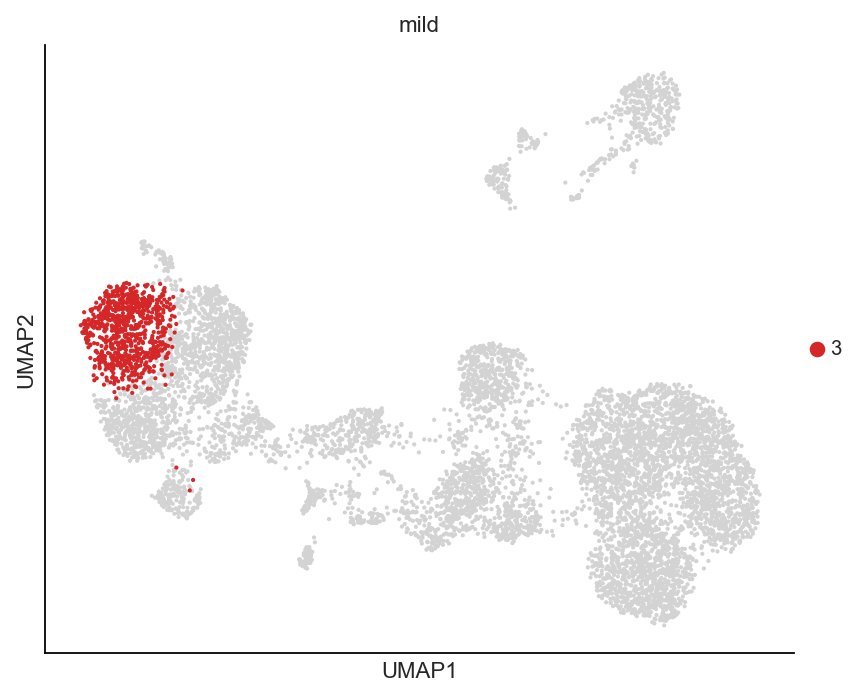

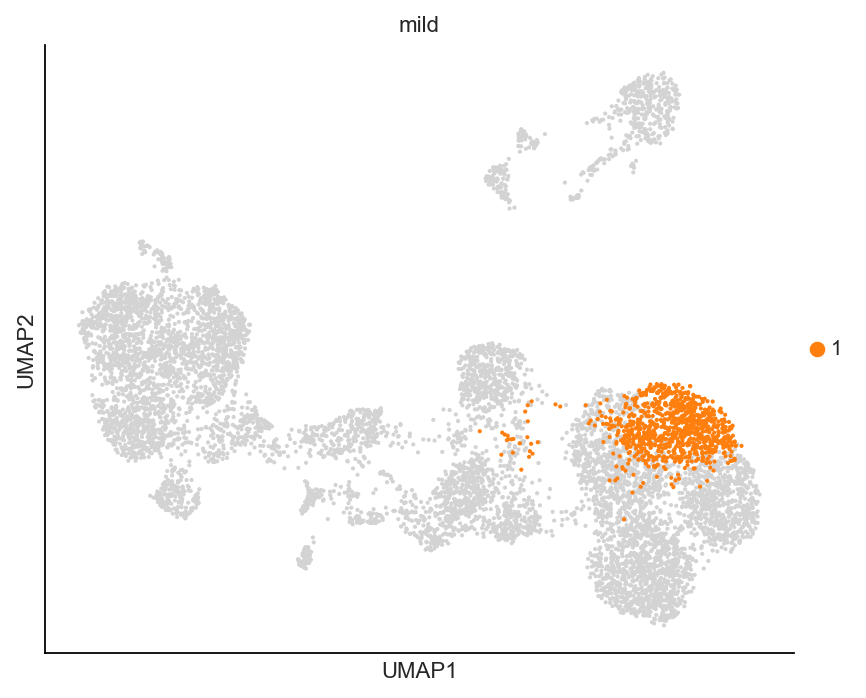

...

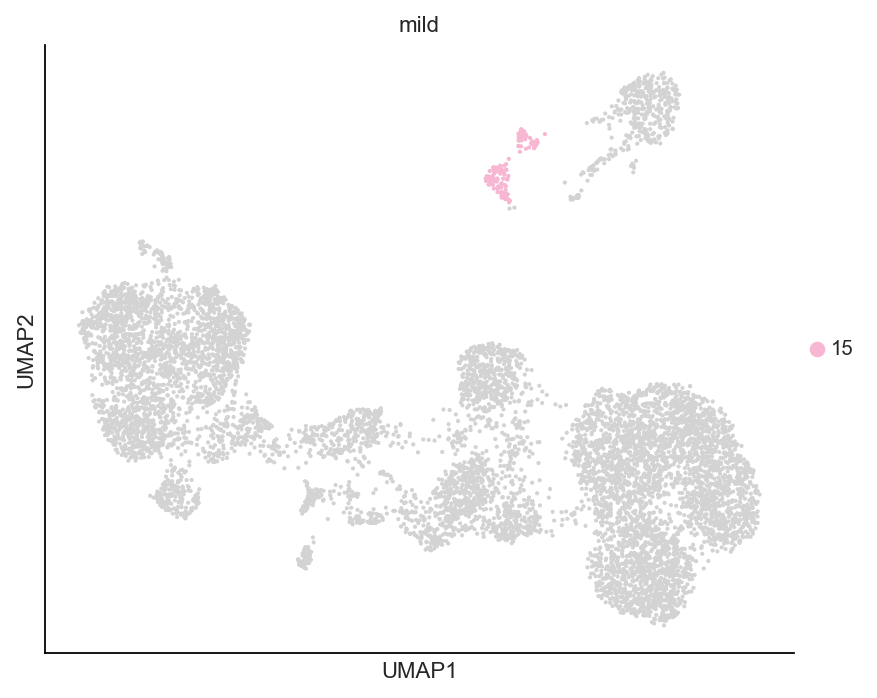

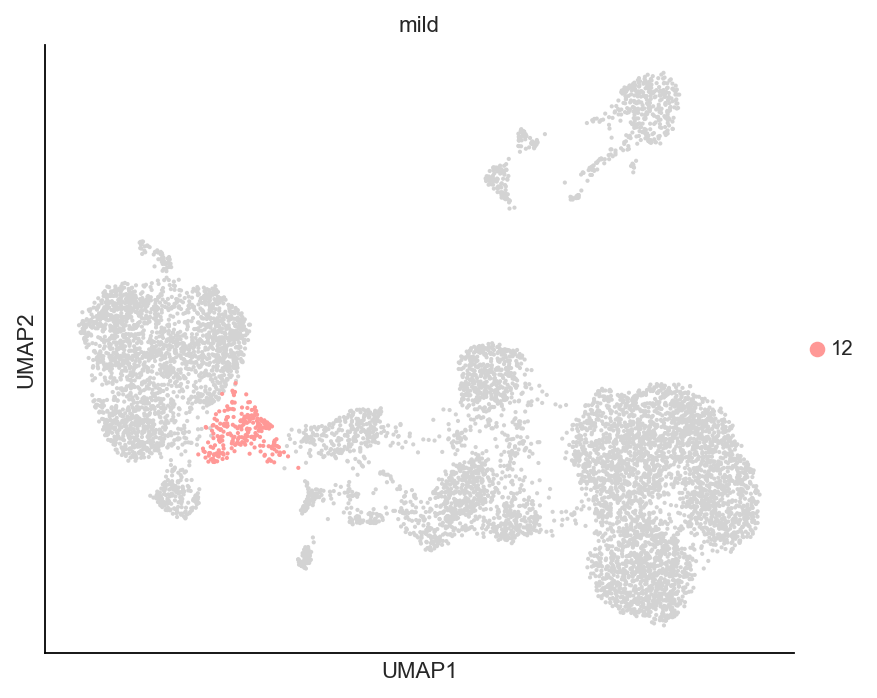

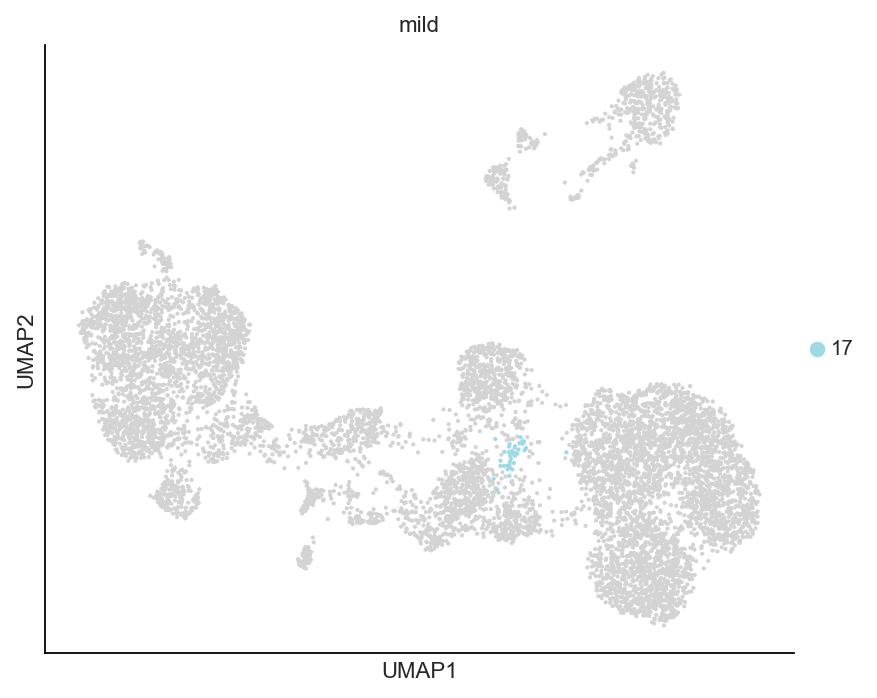

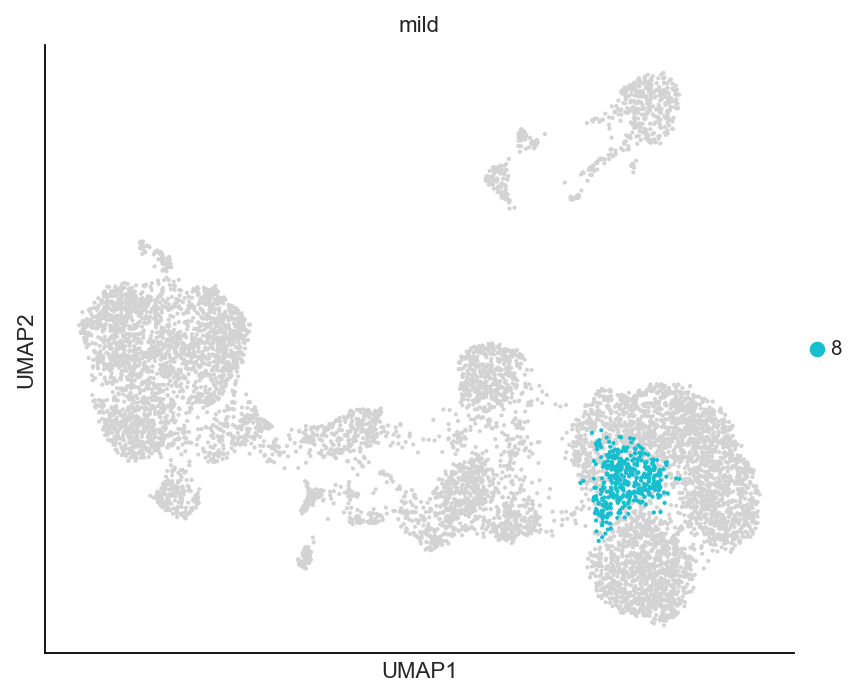

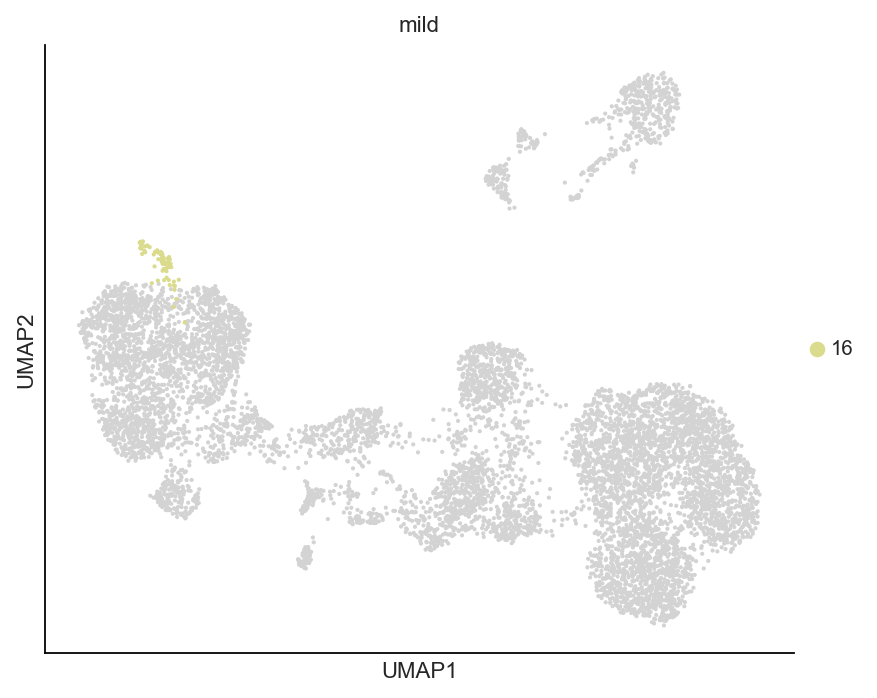

In [22]:
category='mild'
tmp_adata=tmp_adata_batch_corrected_dict[category]
for sp in tmp_adata.obs.louvain.unique():
    tmp_fig=sc.pl.umap(adata=tmp_adata,frameon=True,return_fig=True,use_raw=False,title=category,
                       show=True,groups=sp,color='louvain',add_outline=False)
    sns.despine()
del tmp_adata

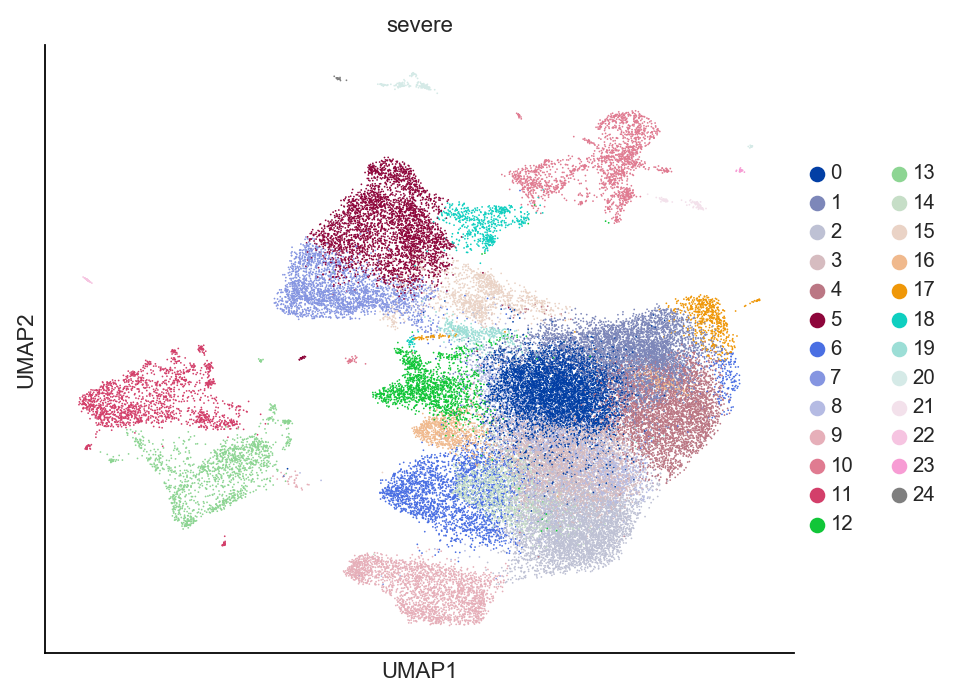

In [23]:
category='severe'
tmp_adata=tmp_adata_batch_corrected_dict[category]
tmp_fig=sc.pl.umap(adata=tmp_adata,frameon=True,return_fig=True,use_raw=False,title=category,
                   color='louvain',add_outline=False)
sns.despine()
del tmp_adata
tmp_fig.savefig(path.join(expt_figdir,'covid19_severe_subpopulation_umap_fig3c.pdf'))

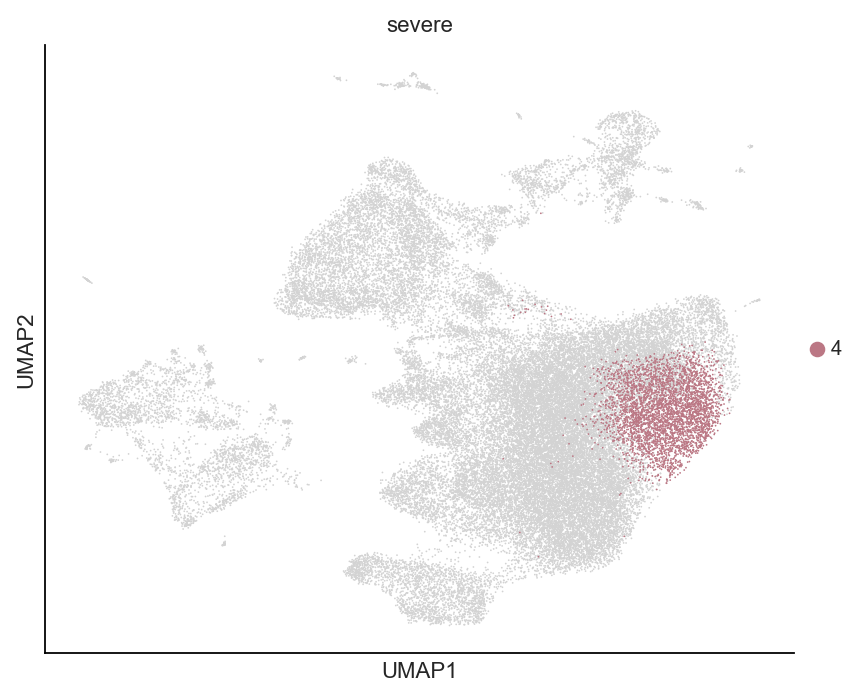

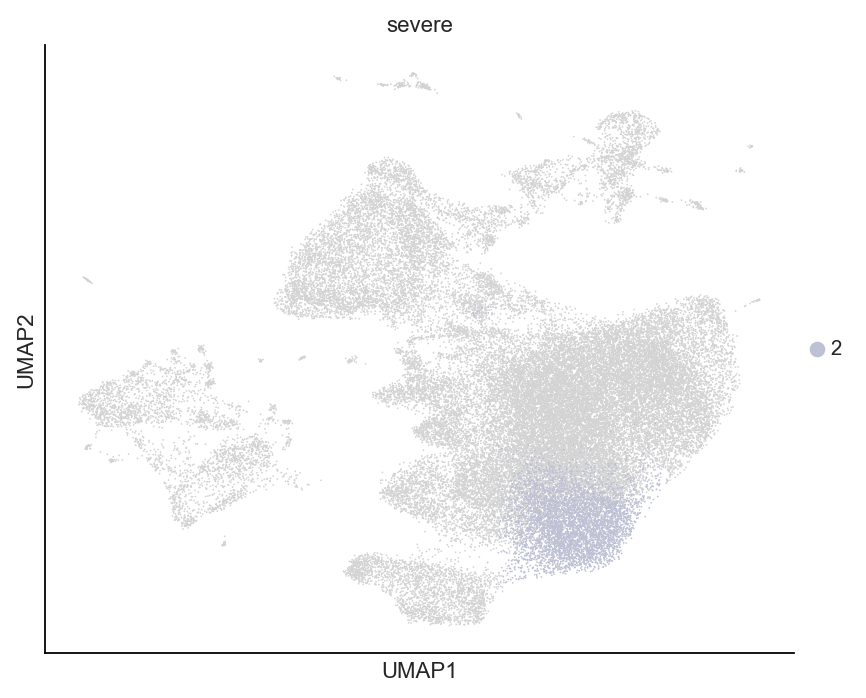

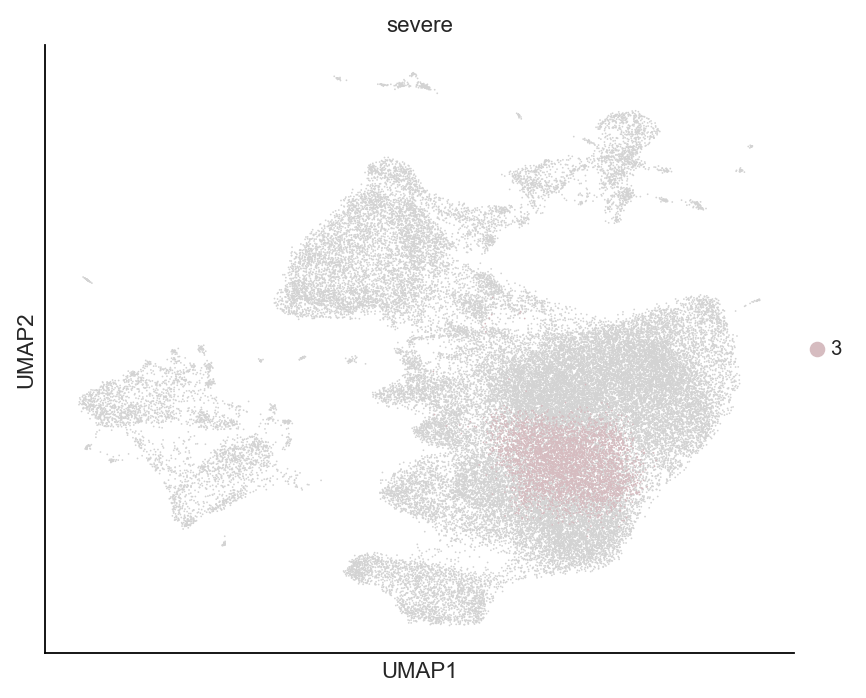

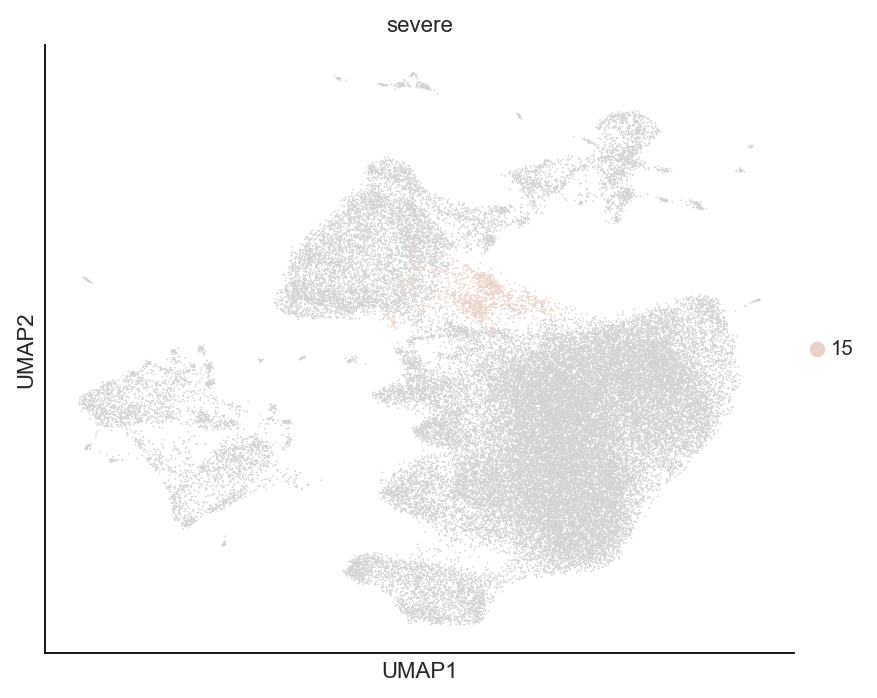

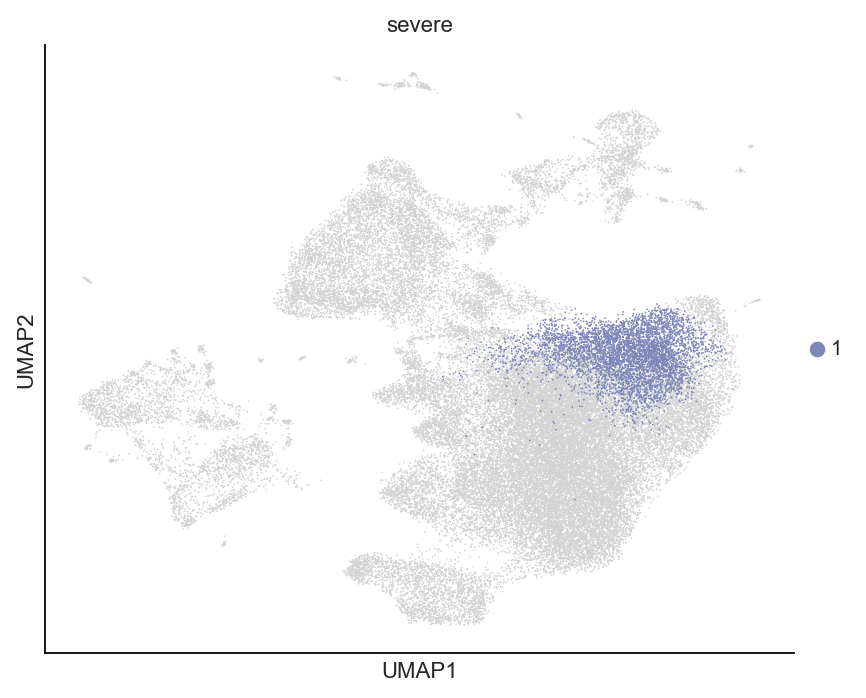

...

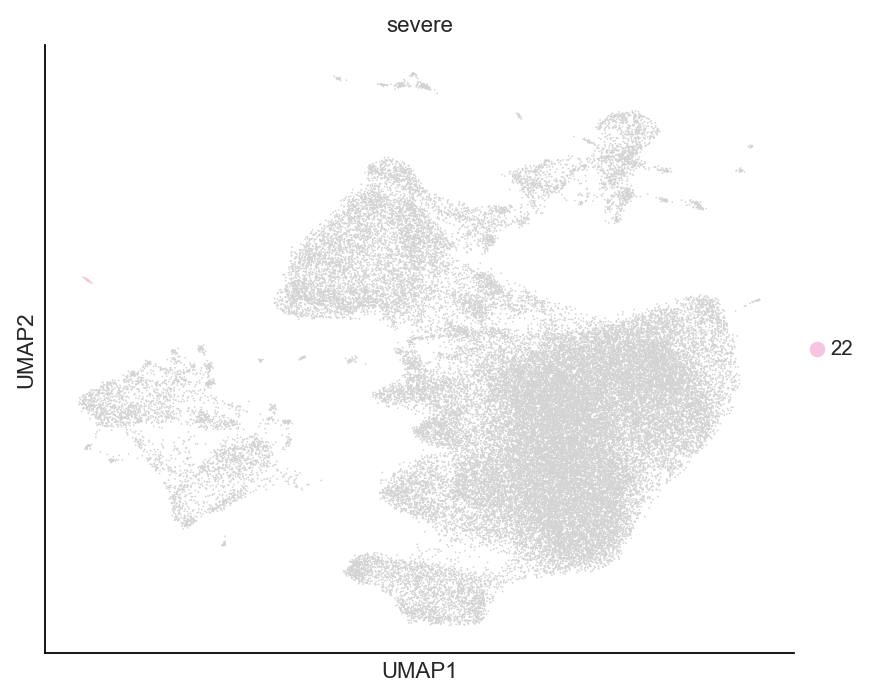

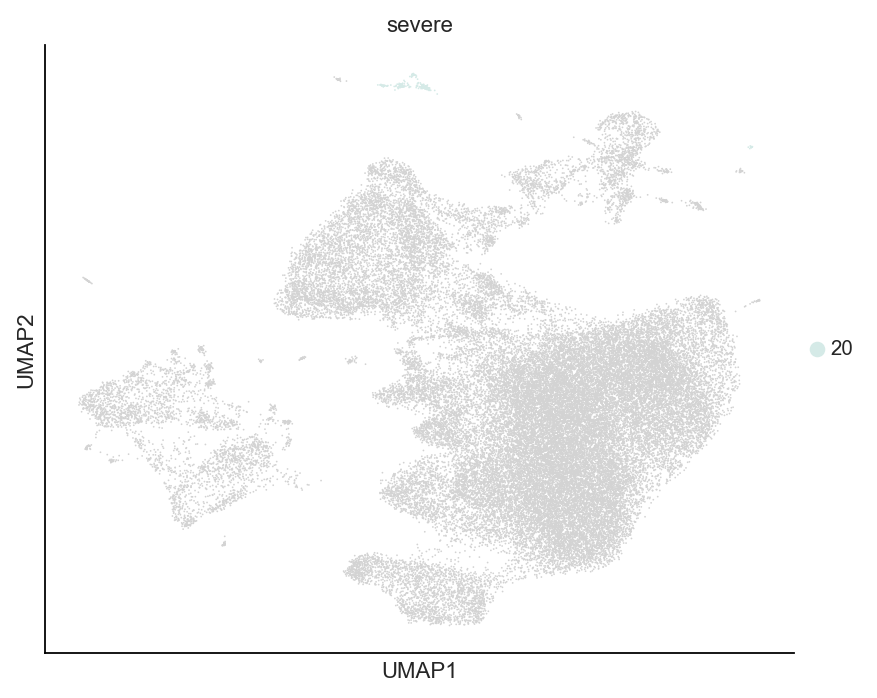

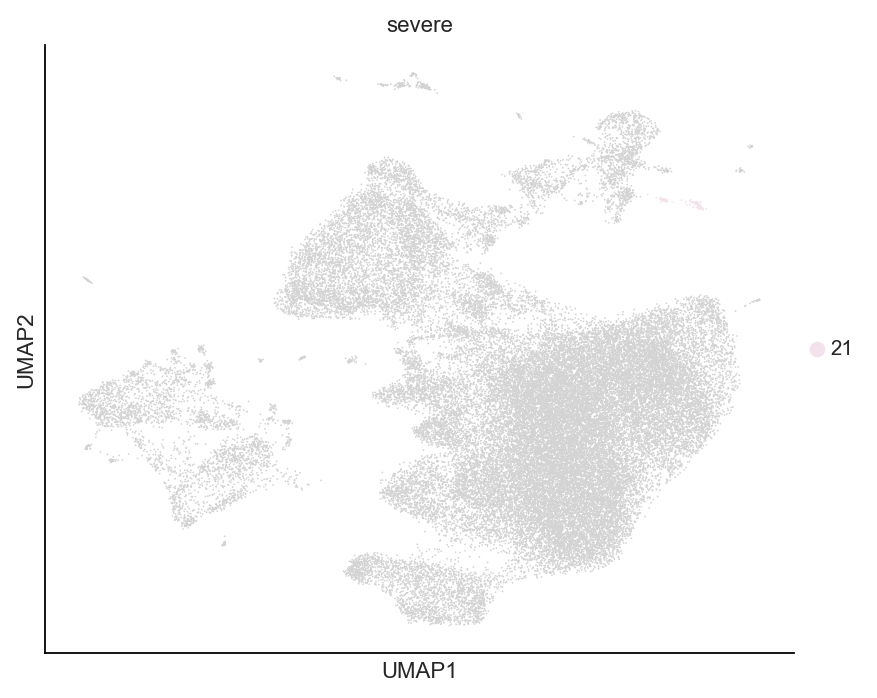

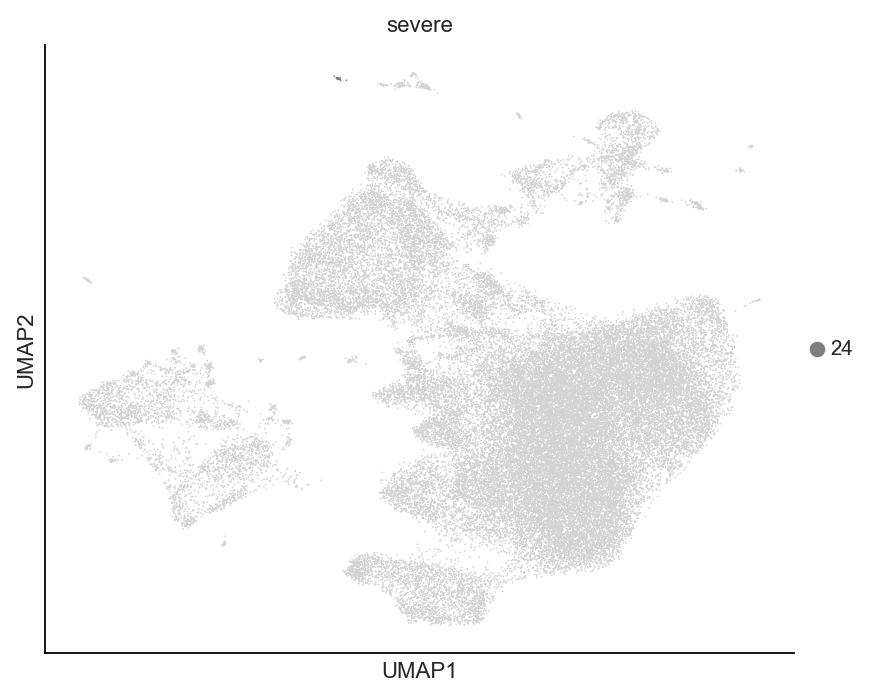

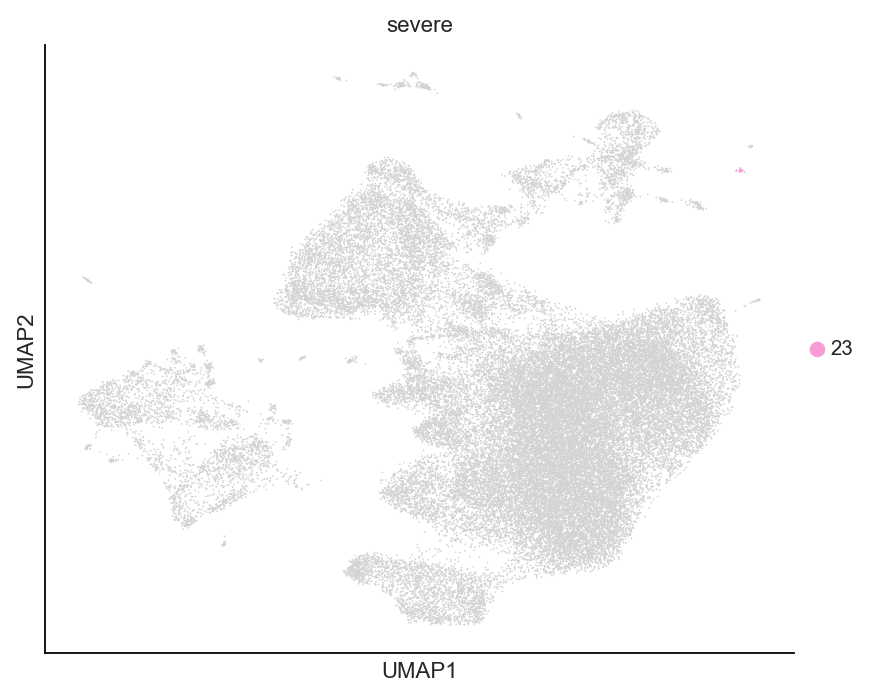

In [24]:
category='severe'
tmp_adata=tmp_adata_batch_corrected_dict[category]
for sp in tmp_adata.obs.louvain.unique():
    tmp_fig=sc.pl.umap(adata=tmp_adata,frameon=True,return_fig=True,use_raw=False,title=category,
                       show=True,groups=sp,color='louvain',add_outline=False)
    sns.despine()
del tmp_adata

mild


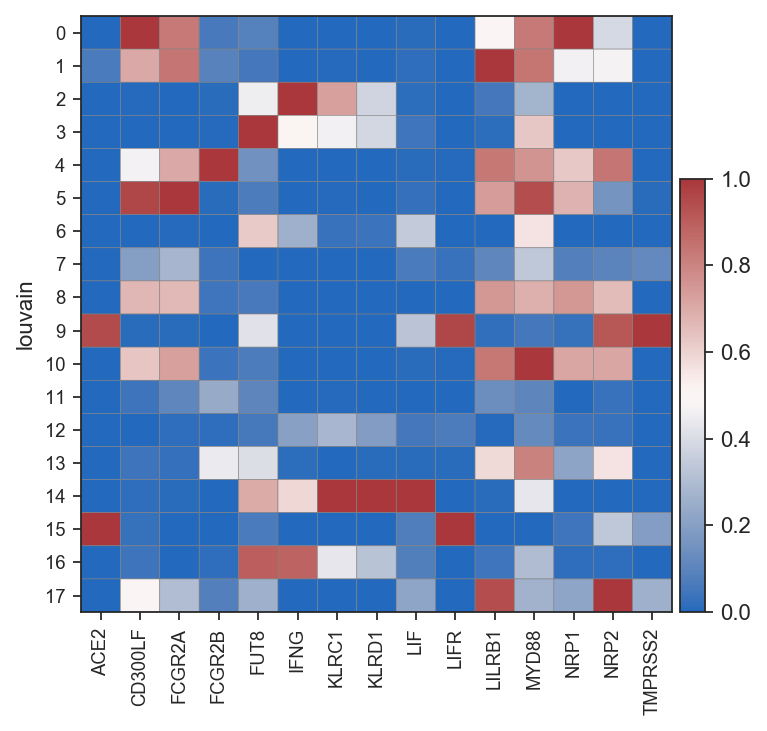

severe


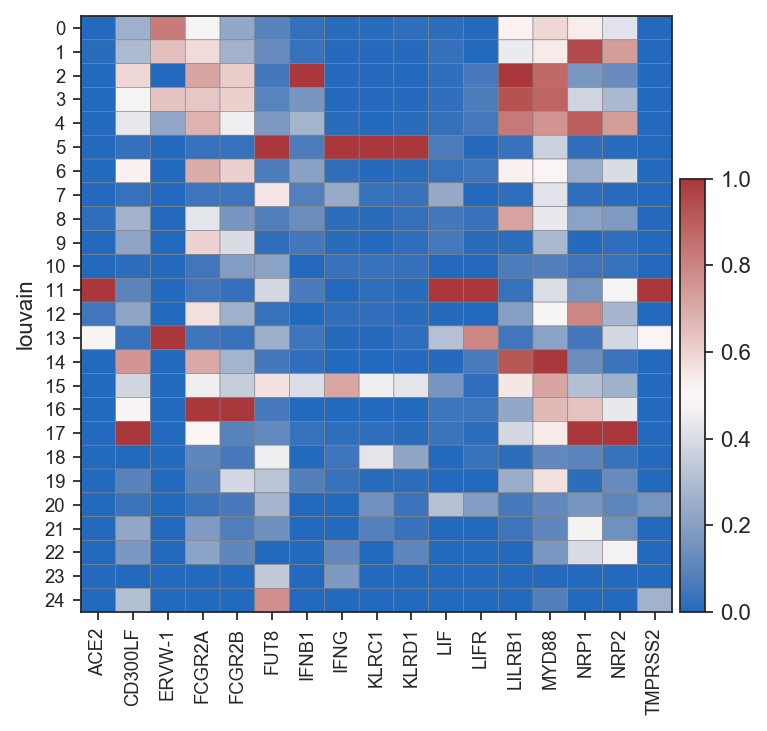

healthy control


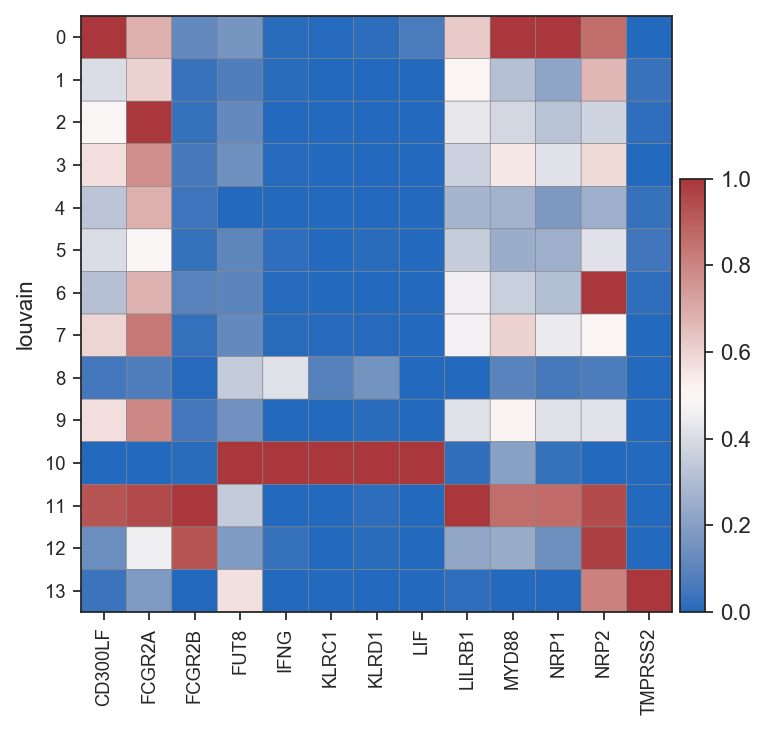

In [25]:
sc.set_figure_params(figsize=(5,5),frameon=True,fontsize=10.0)
sns.set_style(style='ticks')
for k, v in tmp_adata_batch_corrected_dict.items():
    tmp_markers_genes_list=[g for g in sorted(set(ADE_GENES).intersection(v.var['all_genes_hgnc_symbol']))]
    if len(tmp_markers_genes_list)>=1:
        print(k)
        tmp_fig=sc.pl.matrixplot(adata=v,groupby='louvain',gene_symbols='all_genes_hgnc_symbol',
                                 use_raw=False,figsize=(5,5),var_names=tmp_markers_genes_list,
                                 standard_scale='var',
                             cmap=HEATPLOT_PALETTE_CMAP,swap_axes=False,dendrogram=False)
        #plt.title(k)
        #sns.despine()
    del v

mild
severe
healthy control


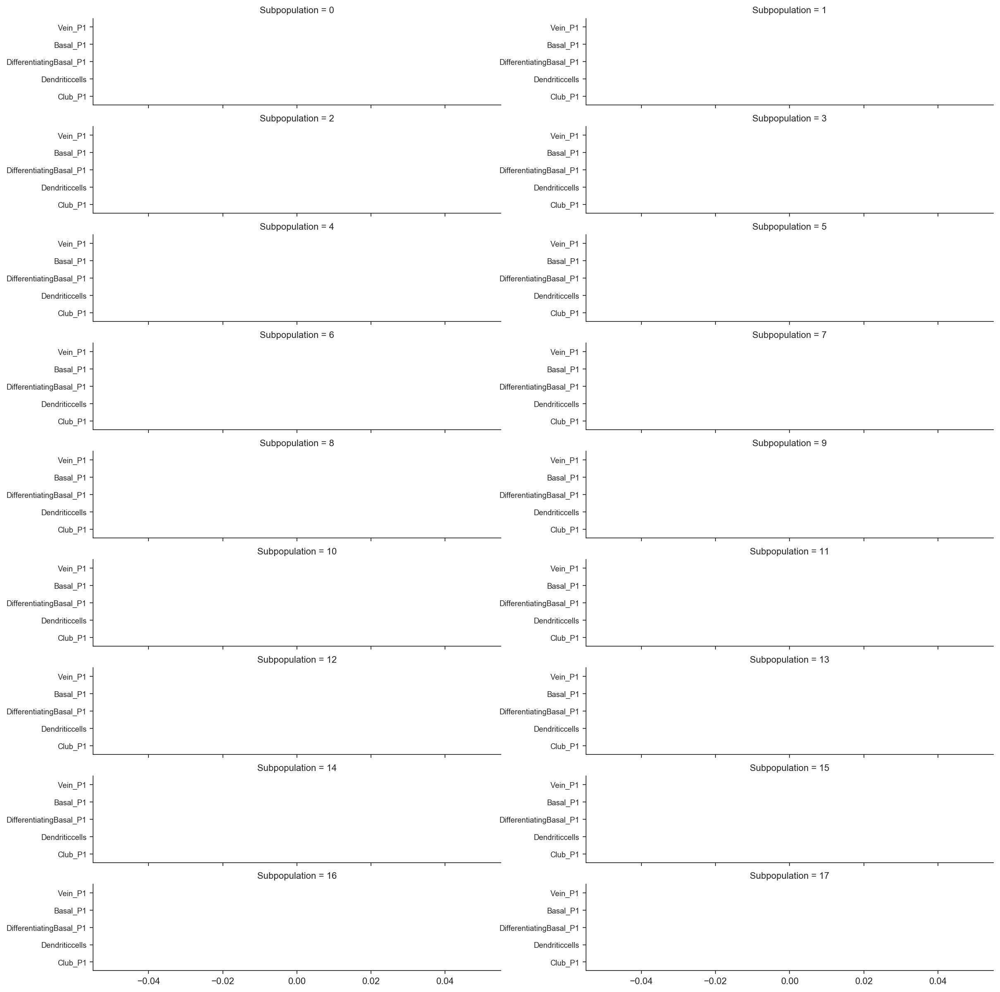

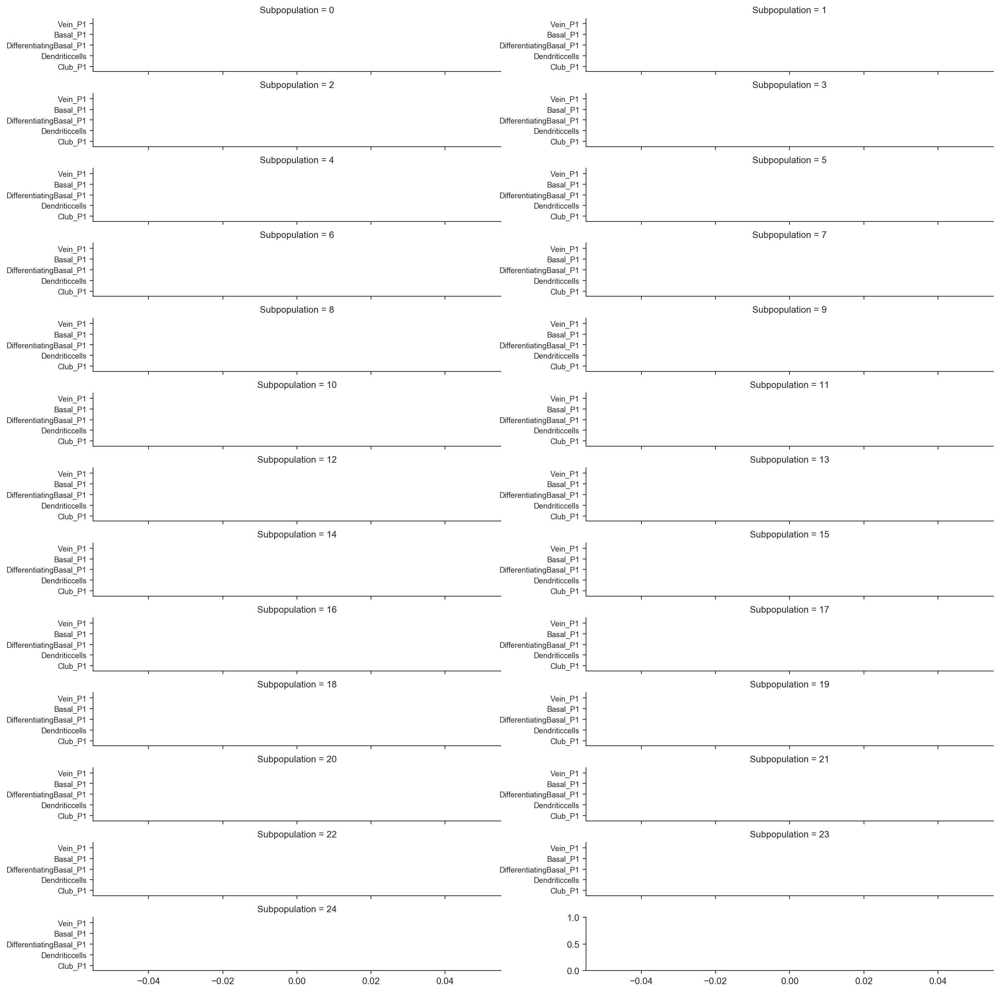

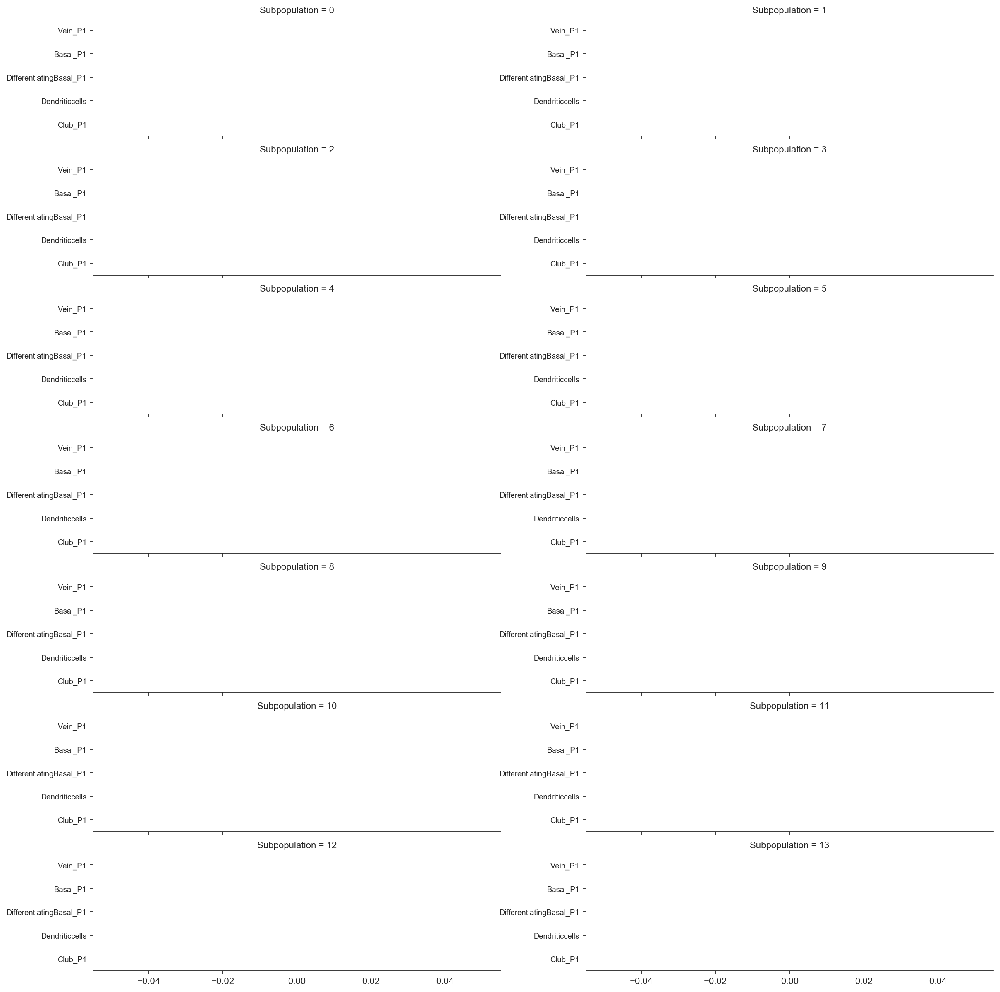

In [31]:
sns.set_style(style='ticks')
fig_size=(15,15)
for k, v in tmp_adata_batch_corrected_dict.items():
    #if k=='mild':continue
    print(k)
    temp_df=sc.tl.marker_gene_overlap(adata=v,reference_markers=cell_type_markers_ensemble_id_dict,
                                             top_n_markers=100,normalize='reference')
    temp_df['type']=temp_df.index
    temp_df=temp_df.melt(id_vars='type',var_name='subpopulation', value_name='markers')
    temp_groups_dict=temp_df.groupby('subpopulation')
    tmp_no_groups=len(temp_groups_dict.groups.keys())
    tmp_tracker=0
    tmp_no_cols=2
    tmp_no_rows=tmp_no_groups//tmp_no_cols if tmp_no_groups%tmp_no_cols==0 else  (tmp_no_groups//tmp_no_cols)+1
    tmp_fig,ax =plt.subplots(nrows=tmp_no_rows,ncols=tmp_no_cols,sharex=True,sharey=False,squeeze=False,
                         **{'figsize':fig_size,'frameon':False})
    tmp_ax_index=[]
    for r in range(tmp_no_rows):
        for c in range(tmp_no_cols):
            tmp_ax_index.append([r,c])
    #tmp_cell_type_colors=sns.color_palette(palette='Set2',n_colors=len([t for t in temp_df.type.unique()]))
    #tmp_cell_type_colors_dict=dict(zip([t for t in temp_df.type.unique()],tmp_cell_type_colors))
    for sp in range(tmp_no_groups):
        tmp_grp_df=temp_groups_dict.get_group(name=str(sp))
        tmp_grp_df=tmp_grp_df.loc[pd.Series.sort_values(tmp_grp_df.markers,ascending=False).index,:].head(5)
        tmp_axis=ax[tmp_ax_index[sp][0],tmp_ax_index[sp][1]]
        sns.barplot(data=tmp_grp_df,dodge=False,ci=None,hue='type',x='markers',y='type',ax=tmp_axis,
                    palette='Set1')
        sns.despine()
        tmp_axis.legend().set_visible(False)
        tmp_axis.set_title('Subpopulation = '+str(sp))
        tmp_y_labels = tmp_axis.get_yticklabels()
        #tmp_axis.set_xticklabels()
        tmp_axis.set_yticklabels(tmp_y_labels,fontdict={'fontsize':'small'})
        #plt.Axes.set_frame_on(False)
        tmp_axis.set_ylabel('')
        tmp_axis.set_xlabel('')
        tmp_fig.tight_layout(pad=0.75)
        tmp_out_fname=str(sc.settings.figdir)+'/'+k+'_cell_types_barplots.pdf'
        tmp_fig.savefig(tmp_out_fname)
        del tmp_grp_df
    del k,v

In [37]:
qc_filtered_adata=sc.read_loom(filename=path.join(expt_dir,'qc_filt_zhang_dataset.loom'))
tmp_cols=[]
for c in qc_filtered_adata.var.columns:
    if not c.startswith('Gene'):continue
    tmp_cols.append(c)
tmp_gene_names_df=qc_filtered_adata.var.loc[:,tmp_cols]
tmp_gene_names=[]
for k,v in tmp_gene_names_df.apply(axis=1,func=pd.unique).items():
    v=v.tolist()
    if len(v)>1:
        v.remove('nan')
    tmp_gene_names.append(v[0])
qc_filtered_adata.var['all_genes_hgnc_symbol']=tmp_gene_names
#qc_filtered_adata.var_names=tmp_gene_names
qc_filtered_adata.var_names_make_unique()
ncov_val=qc_filtered_adata[:,'nCoV'].X.todense()
qc_filtered_adata.obs['nCoV_expression']=[m[0] for m in ncov_val.tolist()]
del tmp_gene_names,k,v,tmp_gene_names_df,tmp_cols,ncov_val

In [38]:
genes_min_cells=1
cells_min_genes=1000
hgv_genes_cnts=None
no_components=20
neighbours_metric='euclidean'
rank_no_genes_cut_off=500
tmp_adata_batch_corrected_dict={}
for tmp_patient in qc_filtered_adata.obs.patient_group.unique():
    tmp_adata=qc_filtered_adata[qc_filtered_adata.obs.index[qc_filtered_adata.obs.patient_group==tmp_patient],:]
    sc.pp.filter_genes(data=tmp_adata,inplace=True,min_cells=genes_min_cells)
    sc.pp.filter_cells(data=tmp_adata,inplace=True,min_genes=cells_min_genes)
    sc.pp.highly_variable_genes(adata=tmp_adata,subset=False,inplace=True,n_top_genes=hgv_genes_cnts,
                                batch_key='sample_accesssion')
    sc.tl.pca(data=tmp_adata,use_highly_variable=True,n_comps=no_components)
    sc.pp.neighbors(adata=tmp_adata,metric=neighbours_metric)
    sc.tl.umap(adata=tmp_adata)
    sc.tl.louvain(adata=tmp_adata,flavor='vtraag')
    sc.tl.rank_genes_groups(adata=tmp_adata,groupby='louvain',method='logreg',rankby_abs=True,
                            n_genes=rank_no_genes_cut_off,use_raw=False)
    tmp_adata_batch_corrected_dict[tmp_patient]=tmp_adata
    del tmp_adata

filtered out 2282 genes that are detected in less than 1 cells


Trying to set attribute `.var` of view, copying.


filtered out 1214 cells that have less than 1000 genes expressed
extracting highly variable genes


... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'batch' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'Gene-0' as categorical
... storing 'Gene-1' as categorical
... storing 'Gene-10' as categorical
... storing 'Gene-11' as 

    finished (0:00:17)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=20
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:18)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 16 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:03)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:02:14)
fil

Trying to set attribute `.var` of view, copying.


filtered out 19966 cells that have less than 1000 genes expressed
extracting highly variable genes


... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'batch' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'Gene-0' as categorical
... storing 'Gene-1' as categorical
... storing 'Gene-10' as categorical
... storing 'Gene-11' as 

    finished (0:00:22)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=20
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:14)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:38)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 18 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:11)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:07:16)
fil

Trying to set attribute `.var` of view, copying.


filtered out 9468 cells that have less than 1000 genes expressed
extracting highly variable genes


... storing 'Sample_characteristics_ch1_cell_subsets' as categorical
... storing 'Sample_characteristics_ch1_patient_group' as categorical
... storing 'Sample_characteristics_ch1_sample_type' as categorical
... storing 'Sample_data_processing' as categorical
... storing 'Sample_data_processing_Genome_build' as categorical
... storing 'Sample_description' as categorical
... storing 'Sample_library_selection' as categorical
... storing 'Sample_library_source' as categorical
... storing 'Sample_library_strategy' as categorical
... storing 'Sample_source_name_ch1' as categorical
... storing 'batch' as categorical
... storing 'louvain' as categorical
... storing 'patient_group' as categorical
... storing 'sample_accesssion' as categorical
... storing 'sample_barcode' as categorical
... storing 'sample_title' as categorical
... storing 'series' as categorical
... storing 'Gene-0' as categorical
... storing 'Gene-1' as categorical
... storing 'Gene-10' as categorical
... storing 'Gene-11' as 

    finished (0:00:12)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=20
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 12 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:08)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:02:01)


In [39]:
for k, v in tmp_adata_batch_corrected_dict.items():
    print(k)
    for kl, l in v.obs.groupby('louvain'):
        print(kl,'(n=',l.shape[0],')')
    print()

mild
0 (n= 1037 )
1 (n= 855 )
2 (n= 838 )
3 (n= 755 )
4 (n= 599 )
5 (n= 567 )
6 (n= 516 )
7 (n= 514 )
8 (n= 355 )
9 (n= 253 )
10 (n= 248 )
11 (n= 236 )
12 (n= 198 )
13 (n= 166 )
14 (n= 83 )
15 (n= 81 )

severe
0 (n= 3398 )
1 (n= 3231 )
2 (n= 3073 )
3 (n= 2914 )
4 (n= 2651 )
5 (n= 1704 )
6 (n= 1571 )
7 (n= 1505 )
8 (n= 1205 )
9 (n= 1163 )
10 (n= 1148 )
11 (n= 1100 )
12 (n= 876 )
13 (n= 844 )
14 (n= 807 )
15 (n= 713 )
16 (n= 702 )
17 (n= 266 )

healthy control
0 (n= 2696 )
1 (n= 2491 )
2 (n= 2293 )
3 (n= 1980 )
4 (n= 1775 )
5 (n= 1430 )
6 (n= 1322 )
7 (n= 936 )
8 (n= 426 )
9 (n= 237 )
10 (n= 117 )
11 (n= 45 )



In [34]:
for k, v in tmp_adata_batch_corrected_dict.items():
    print(k)
    for kl, l in v.obs.groupby('louvain'):
        print(kl,'(n=',l.shape[0],')')
    print()

mild
0 (n= 1037 )
1 (n= 855 )
2 (n= 838 )
3 (n= 755 )
4 (n= 599 )
5 (n= 567 )
6 (n= 516 )
7 (n= 514 )
8 (n= 355 )
9 (n= 253 )
10 (n= 248 )
11 (n= 236 )
12 (n= 198 )
13 (n= 166 )
14 (n= 83 )
15 (n= 81 )

severe
0 (n= 3398 )
1 (n= 3231 )
2 (n= 3073 )
3 (n= 2914 )
4 (n= 2651 )
5 (n= 1704 )
6 (n= 1571 )
7 (n= 1505 )
8 (n= 1205 )
9 (n= 1163 )
10 (n= 1148 )
11 (n= 1100 )
12 (n= 876 )
13 (n= 844 )
14 (n= 807 )
15 (n= 713 )
16 (n= 702 )
17 (n= 266 )

healthy control
0 (n= 2696 )
1 (n= 2491 )
2 (n= 2293 )
3 (n= 1980 )
4 (n= 1775 )
5 (n= 1430 )
6 (n= 1322 )
7 (n= 936 )
8 (n= 426 )
9 (n= 237 )
10 (n= 117 )
11 (n= 45 )



mild


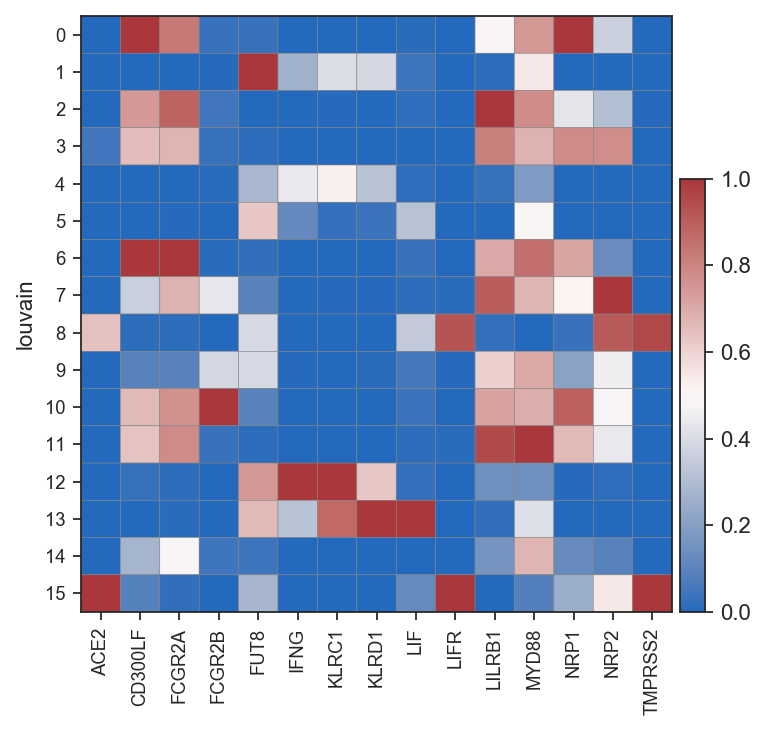

severe


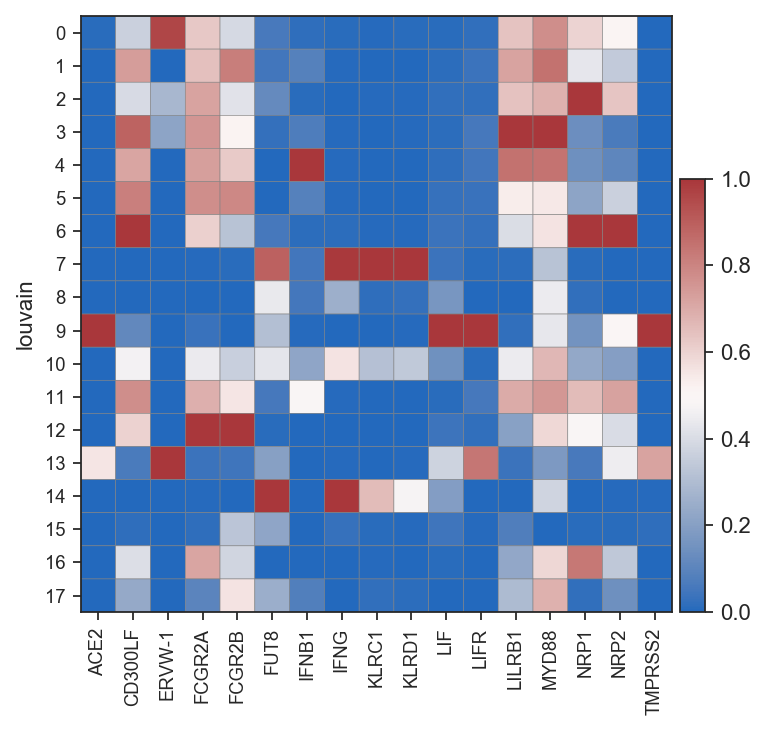

healthy control


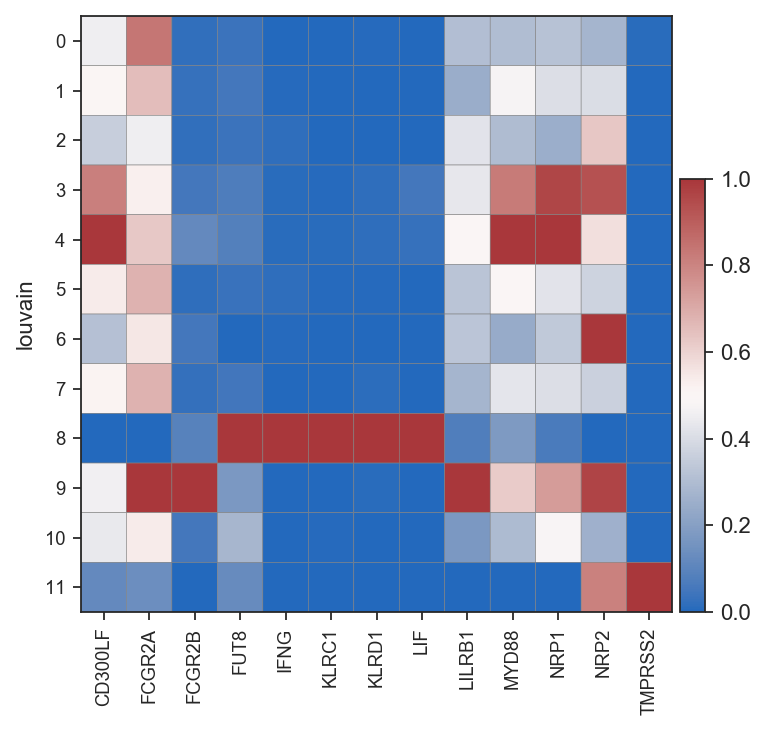

In [35]:
sc.set_figure_params(figsize=(5,5),frameon=True,fontsize=10.0)
sns.set_style(style='ticks')
for k, v in tmp_adata_batch_corrected_dict.items():
    tmp_markers_genes_list=[g for g in sorted(set(ADE_GENES).intersection(v.var['all_genes_hgnc_symbol']))]
    if len(tmp_markers_genes_list)>=1:
        print(k)
        tmp_fig=sc.pl.matrixplot(adata=v,groupby='louvain',gene_symbols='all_genes_hgnc_symbol',
                                 use_raw=False,figsize=(5,5),var_names=tmp_markers_genes_list,
                                 standard_scale='var',
                             cmap=HEATPLOT_PALETTE_CMAP,swap_axes=False,dendrogram=False)
        #plt.title(k)
        #sns.despine()
    del v

mild
severe
healthy control


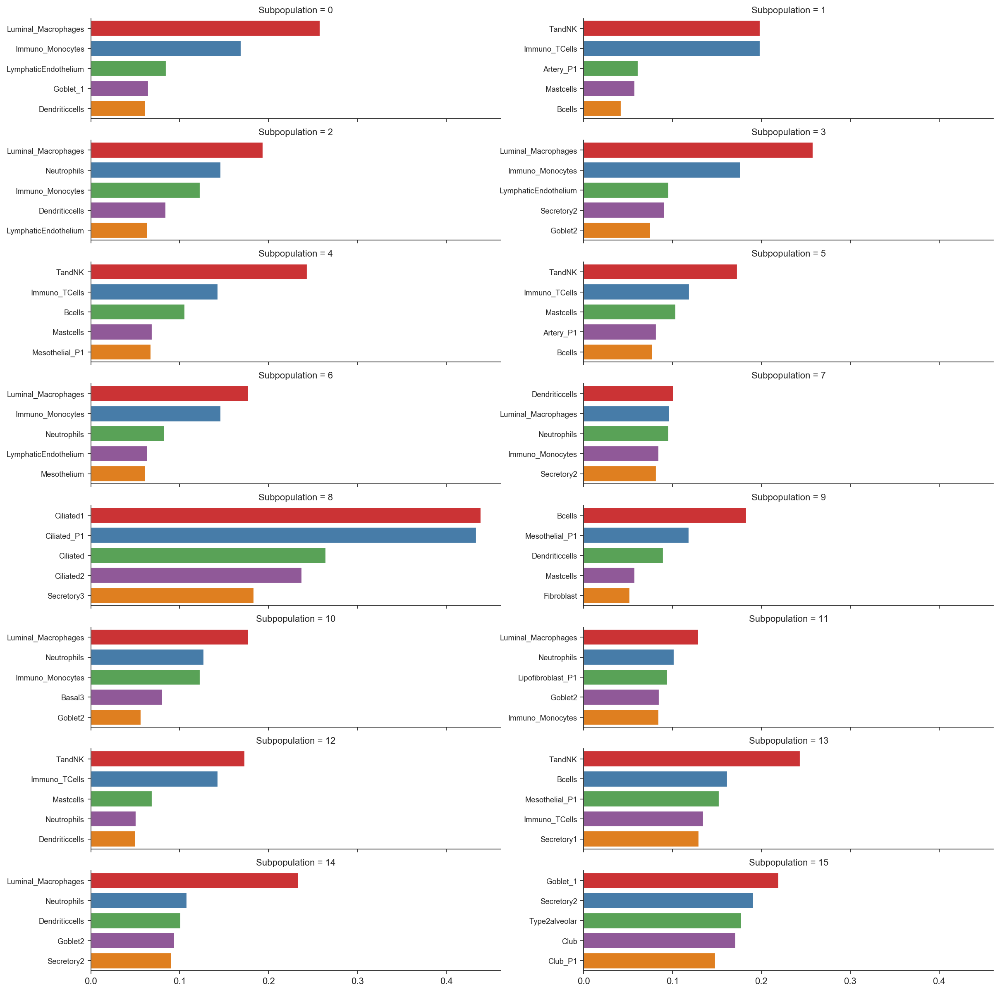

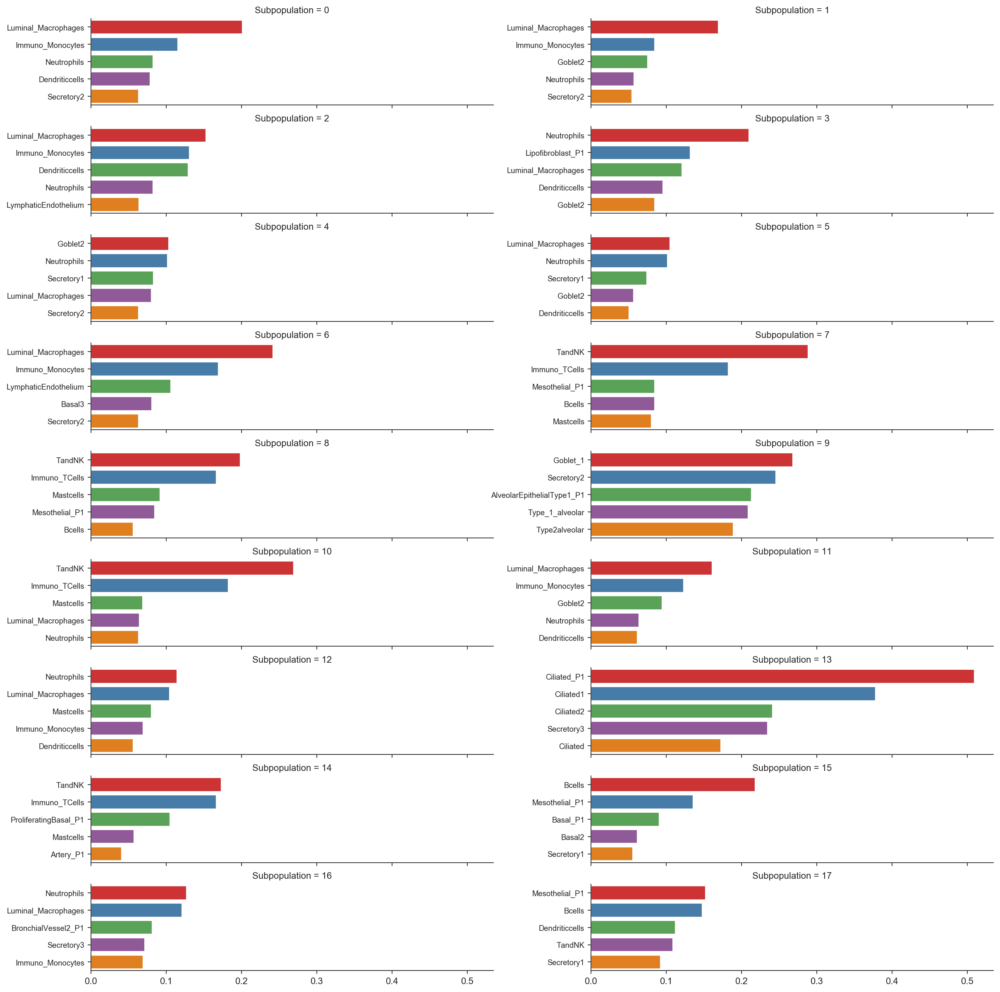

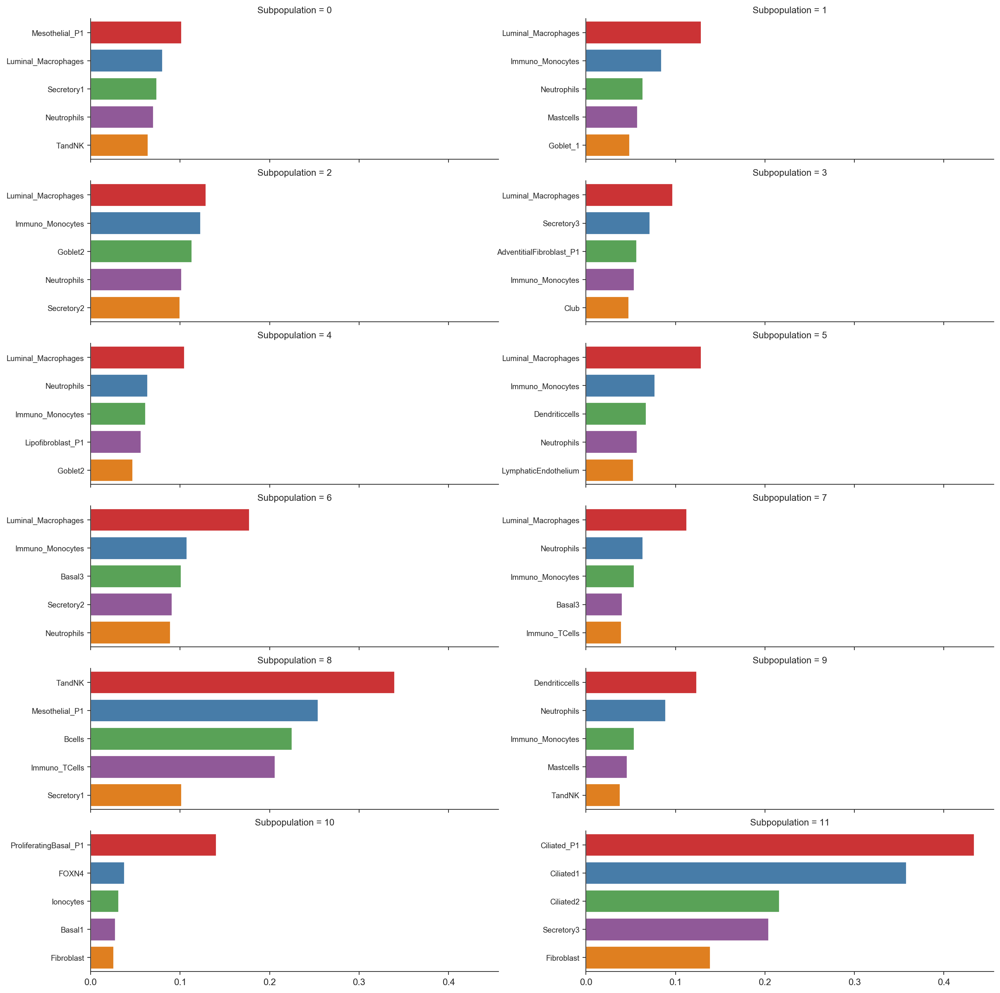

In [36]:
sns.set_style(style='ticks')
fig_size=(15,15)
for k, v in tmp_adata_batch_corrected_dict.items():
    #if k=='mild':continue
    print(k)
    temp_df=sc.tl.marker_gene_overlap(adata=v,reference_markers=cell_type_markers_ensemble_id_dict,
                                             top_n_markers=100,normalize='reference')
    temp_df['type']=temp_df.index
    temp_df=temp_df.melt(id_vars='type',var_name='subpopulation', value_name='markers')
    temp_groups_dict=temp_df.groupby('subpopulation')
    tmp_no_groups=len(temp_groups_dict.groups.keys())
    tmp_tracker=0
    tmp_no_cols=2
    tmp_no_rows=tmp_no_groups//tmp_no_cols if tmp_no_groups%tmp_no_cols==0 else  (tmp_no_groups//tmp_no_cols)+1
    tmp_fig,ax =plt.subplots(nrows=tmp_no_rows,ncols=tmp_no_cols,sharex=True,sharey=False,squeeze=False,
                         **{'figsize':fig_size,'frameon':False})
    tmp_ax_index=[]
    for r in range(tmp_no_rows):
        for c in range(tmp_no_cols):
            tmp_ax_index.append([r,c])
    #tmp_cell_type_colors=sns.color_palette(palette='Set2',n_colors=len([t for t in temp_df.type.unique()]))
    #tmp_cell_type_colors_dict=dict(zip([t for t in temp_df.type.unique()],tmp_cell_type_colors))
    for sp in range(tmp_no_groups):
        tmp_grp_df=temp_groups_dict.get_group(name=str(sp))
        tmp_grp_df=tmp_grp_df.loc[pd.Series.sort_values(tmp_grp_df.markers,ascending=False).index,:].head(5)
        tmp_axis=ax[tmp_ax_index[sp][0],tmp_ax_index[sp][1]]
        sns.barplot(data=tmp_grp_df,dodge=False,ci=None,hue='type',x='markers',y='type',ax=tmp_axis,
                    palette='Set1')
        sns.despine()
        tmp_axis.legend().set_visible(False)
        tmp_axis.set_title('Subpopulation = '+str(sp))
        tmp_y_labels = tmp_axis.get_yticklabels()
        #tmp_axis.set_xticklabels()
        tmp_axis.set_yticklabels(tmp_y_labels,fontdict={'fontsize':'small'})
        #plt.Axes.set_frame_on(False)
        tmp_axis.set_ylabel('')
        tmp_axis.set_xlabel('')
        tmp_fig.tight_layout(pad=0.75)
        tmp_out_fname=str(sc.settings.figdir)+'/'+k+'_cell_types_barplots.pdf'
        tmp_fig.savefig(tmp_out_fname)
        del tmp_grp_df
    del k,v